## Chapter 5 Regime Definition

1. Import Libraries 
2. Define utilities functions
3. mpf charting modules
4. Benchmark and currency batch download
5. Range breakout regime methodology
6. Turtle for dummies
7. Moving average crossover
8. Fractals
9. Higher Highs Higher Lows
10. Floor/Ceiling Regime: the fractals method
11. A little more pleasant working format
12. Plotly library 
13. Comparison between higher highs, higher lows and Floor & Ceiling
14. Looking for the bar that triggered the bear market

### 1. Import Libraries & utilities functions

In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
%matplotlib inline
import matplotlib.pyplot as plt
import mplfinance as mpf
import pathlib
import time

### 2. Utilities functions
1. rel_fx(df,_o,_h,_l,_c, bm_df, bm, ccy_df, ccy, start, end,rebase=True): returns price series adjusted for currency and benchmark. rebase boolean rebases prices to the beginning of the series or uses continuous series
2. rohlc(df,relative = False): return _o,_h,_l,_c in small case or title, absolute or relative
3. regime_args(): returns regime definition arguments in absolute/relative for specified level (2 or 3). Example: low in absolute level 2 is 'lo2', High in relative at level 3 is 'rH3'
4. yf_droplevel(): converts MultiIndex dataframe from yfinance into single level OHLCV df
5. last_row_col_dict(): creates a dictionary for the latest not null values across a subset of columns


In [2]:
def rel_fx(df,_o,_h,_l,_c, bm_df, bm, ccy_df, ccy, start, end,rebase = True, mult = 1):
    df[ccy] = ccy_df.loc[start:end,ccy].copy().ffill()
    df[bm] = bm_df.loc[start:end,bm].copy().ffill()
    for i in [_o,_h,_l,_c]:
        df[f'r{i}'] = df[i].div(df[ccy])
        if rebase == True:
            df[f'r{i}'] = df[f'r{i}'].div(df[bm]).mul(df[df[bm].notna()][bm][0])
        else:
            df[f'r{i}'] = df[f'r{i}'].div(df[bm]) * mult
    return df

def rohlc(df,relative = False):
    if relative==True:
        rel = 'r'
    else:
        rel= ''      
    if 'Open' in df.columns:
       _o,_h,_l,_c = f'{rel}Open',f'{rel}High',f'{rel}Low',f'{rel}Close'      
    elif 'open' in df.columns:
        _o,_h,_l,_c = f'{rel}open',f'{rel}high',f'{rel}low',f'{rel}close'
    else:
        _o=_h=_l=_c= np.nan
    return _o,_h,_l,_c

def yf_droplevel(batch_download,ticker):
    df = batch_download.iloc[:, batch_download.columns.get_level_values(1) == ticker]
    df.columns = df.columns.droplevel(1)
    df = df.dropna()
    return df

def last_row_cols_dict(df,ticker,df_cols):
    last_row_idx = df.index.max()
    col_dict = {'ticker':str.upper(ticker),'date':df.index.max()}
    for col in df_cols:
        if pd.isnull(df.loc[last_row_idx,col]):
            try:
                last_idx = df[pd.notnull(df.loc[:,col])].index[-1]
                col_dict.update({f'{col}_dt': last_idx})
                col_dict.update({col : df.loc[last_idx,col]})
            except:
                col_dict.update({f'{col}_dt': np.nan})
                col_dict.update({col : np.nan})
        else:
            col_dict.update({col : df.loc[last_row_idx,col]})
    return col_dict

### 3. mpf charting modules

1. mpf_score(data, score_list, alfa, color_bull, color_bear,  pane, vlabel):
2. mpf_relative(data, rel, sma_list, pane, color= 'grey'):
3. mpf_breakout(data, color_bull, color_bear, alfa, pane, n, field):
4. mpf_turtle(data, st, lt, color_bull, color_bear, alfa, pane, field):
5. mpf_sma(data, st, lt, color_bull, color_bear, alfa, pane, field): 
6. mpf_fractals(data, fractals_list, color_up, color_down, size, pane): 
7. mpf_fractals_fill(data, fractals_list, alfa, color_bull, color_bear, pane,y_suffix, rg_suffix): 

In [3]:
def mpf_score(data, score_list, alfa, color_bull, color_bear,  pane, vlabel):
    score_fill = []
    for r,scr in enumerate(score_list):
        if (scr in data.columns):
            if (data[scr].sum() != 0):
                score_bull = dict(y1= 0, y2= data[scr].values , alpha= alfa / (r+1), color= color_bull,
                                where = (data[scr].values >= 0))
                score_fill.append(score_bull)            
                score_bear = dict(y1= data[scr].values, y2= 0 , alpha= alfa / (r+1), color= color_bear,
                                        where = (data[scr].values<= 0))
                score_fill.append(score_bear)
                score = mpf.make_addplot(data[scr], fill_between = score_fill,color='blue',
                                          alpha = alfa/(r+1), panel= pane, ylabel = vlabel)
                subplots.append(score)
                
def mpf_relative(data, rel, sma_list, pane, color= 'grey'):
    if (rel == True):
        _o,_h,_l,_c = rohlc(data,relative = rel)
        if (_c in data.columns):
            rel_plot = mpf.make_addplot(data[_c],type='line', color = color, ylabel = str(_c),alpha =1, mav = tuple(sorted(sma_list)),
                                                 panel = pane)
            subplots.append(rel_plot)

def mpf_breakout(data, color_bull, color_bear, alfa, pane, n, field):
    breakout_fill = []
    breakout_bull = dict(y1= data[_c].values, y2= data[_c].rolling(n).min().values, alpha= alfa, color= color_bull, where = (data[field].values > 0))
    breakout_fill.append(breakout_bull)
    breakout_bear = dict(y1= data[_c].rolling(n).max().values, y2= data[_c].values, alpha= alfa, color= color_bear, where = (data[field].values < 0))
    breakout_fill.append(breakout_bear)    
    breakout = mpf.make_addplot(data[_c],fill_between = breakout_fill,color='blue', alpha= 0, panel= pane)
    subplots.append(breakout)
        
def mpf_turtle(data, st, lt, color_bull, color_bear, alfa, pane, field):
    tt_fill = []
    tt_bull_st = dict(y1= data[_c].rolling(st).min().values, y2= data[_c].values, alpha= alfa, color= color_bull, 
                   where = (data[field].values > 0))
    tt_fill.append(tt_bull_st)
    tt_bull_lt = dict(y1= data[_c].rolling(lt).min().values, y2= data[_c].values, alpha= alfa/2, color= color_bull, 
                   where = (data[field].values > 0))
    tt_fill.append(tt_bull_lt)
    
    tt_bear_st = dict(y1= data[_c].rolling(st).max().values, y2= data[_c].values, alpha= alfa, color= color_bear,
                   where = (data[field].values < 0))
    tt_fill.append(tt_bear_st) 
    tt_bear_lt = dict(y1= data[_c].rolling(lt).max().values, y2= data[_c].values, alpha= alfa/2, color= color_bear,
                   where = (data[field].values < 0))
    tt_fill.append(tt_bear_lt)   
    tt = mpf.make_addplot(data[_c],fill_between = tt_fill,color='blue', alpha=0 , panel= pane)
    subplots.append(tt)      

def mpf_sma(data, st, lt, color_bull, color_bear, alfa, pane, field): 
    sma_fill = []
    sma_st = data[_c].rolling(st).mean().values
    sma_lt = data[_c].rolling(lt).mean().values    
    sma_bull_profit = dict(y1= sma_lt, y2= data[_c].values, alpha= alfa, color= color_bull, 
                   where = (data[field].values > 0))
    sma_fill.append(sma_bull_profit)
    sma_bull_loss = dict(y1= sma_st, y2= data[_c].values, alpha= alfa/2, color= color_bear, 
                   where = (data[field].values > 0) & (data[_c] < sma_st))
    sma_fill.append(sma_bull_loss)
    
    sma_bear_profit = dict(y1= data[_c].rolling(lt).mean().values, y2= data[_c].values, alpha= alfa, color= color_bear,
                   where = (data[field].values < 0))
    sma_fill.append(sma_bear_profit) 
    sma_bear_loss = dict(y1= data[_c].rolling(st).mean().values, y2= data[_c].values, alpha= alfa, color= color_bull,
                   where = (data[field].values < 0) & (data[_c] > sma_st))
    sma_fill.append(sma_bear_loss)  
        
    sma = mpf.make_addplot(data[_c],fill_between = sma_fill,color='blue', alpha=0 , panel= pane)
    subplots.append(sma)    

def mpf_fractals(data, fractals_list, color_up, color_down, size, pane):     
    for f in fractals_list:
        if (f'{str(_h)[:2]}{str(f)}' in data.columns) & (data[f'{str(_h)[:2]}{str(f)}'].count()>0):
            fractal_down = mpf.make_addplot(data[f'{str(_h)[:2]}{str(f)}'], type= 'scatter', markersize= int(size*f/max(fractals_list)) , 
                                    marker= 'v', color= color_down, alpha = f/max(fractals_list),panel = pane)
            subplots.append(fractal_down)
            
        if (f'{str(_l)[:2]}{str(f)}' in data.columns) & (data[f'{str(_l)[:2]}{str(f)}'].count() >0):
            fractal_up = mpf.make_addplot(data[f'{str(_l)[:2]}{str(f)}'], type= 'scatter', markersize= int(size*f/max(fractals_list)) , 
                                    marker= '^', color= color_up, alpha = f/max(fractals_list),panel = pane)
            subplots.append(fractal_up)
            
def mpf_fractals_fill(data, fractals_list, alfa, color_bull, color_bear, pane,y_suffix, rg_suffix):     
    for a,f in enumerate(fractals_list):
        rg_fill = []
        if (f'{str(_h)[:2]}{str(_l)[:2]}{str(f)}{y_suffix}' in data.columns) & (f'{str(_h)[:2]}{str(_l)[:2]}{rg_suffix}{str(f)}' in data.columns):
            chg_bull = dict(y1= data[f'{str(_h)[:2]}{str(_l)[:2]}{str(f)}{y_suffix}'].values, y2= data[_c].values, alpha= alfa/(a+1), color= color_bull,
                        where = (data[f'{str(_h)[:2]}{str(_l)[:2]}{rg_suffix}{str(f)}'].values > 0))
            rg_fill.append(chg_bull)
                    
            chg_bear = dict(y1= data[f'{str(_h)[:2]}{str(_l)[:2]}{str(f)}{y_suffix}'].values, y2= data[_c].values, alpha= alfa/(a+1), color= color_bear,
                        where = (data[f'{str(_h)[:2]}{str(_l)[:2]}{rg_suffix}{str(f)}'] <0))
            rg_fill.append(chg_bear)
        
        regime_fill = mpf.make_addplot(data[_c], fill_between = rg_fill,panel = pane, type='line', color='grey', alpha = 0)
        subplots.append(regime_fill)
   

### 4. Benchmark and currency batch download

1. batch_px_df(tickers_list,batch_size, start, end,show_batch = False):
2. df_from_dict(batch_size,dct,start,end):

In [4]:
def batch_px_df(tickers_list,batch_size, start, end,show_batch = False):
    px_df = pd.DataFrame()
    loop_size = int(len(tickers_list) // batch_size) + 2
    for t in range(1,loop_size): # Batch download
        try:
            m = (t - 1) * batch_size
            n = t * batch_size
            batch_list = tickers_list[m:n]
            if show_batch:
                print(batch_list,m,n)
            batch_download = yf.download(tickers= batch_list,start= start, end = end, interval = "1d",
                                group_by = 'column',auto_adjust = True, prepost = True,  proxy = None)['Close']
            px_df = px_df.join(batch_download, how='outer')
        except:
            pass
    return px_df

def df_from_dict(batch_size,dct,start,end):
    tickers_list = list(dct.keys())
    df = batch_px_df(tickers_list,batch_size, start, end,show_batch = False)
    df = df.rename(columns = dct)
    df = df.ffill()
    return df

dict_bm =  {'^GSPC':'SP500','^DJI':'DOW30','^IXIC':'Nasdaq100','^NYA':'NYSE ','^XAX':'Nyse_Amex','^RUT':'Russell2000','^VIX':'VIX',
'^BUK100P':'CBOEUK100','^FTSE':'FTSE100','^GDAXI':'DAX','^FCHI':'CAC40','^STOXX50E':'EuroStocks50','^N100':'Euronext100','^BFX':'BEL20',
'^N225':'Nikkei225','^HSI':'HangSeng','000001.SS':'SSE','399001.SZ':'Shenzhen'} 

dict_ccy = {'EURUSD=X':'EURUSD','JPY=X':'USDJPY','GBPUSD=X':'GBPUSD','AUDUSD=X':'AUDUSD',
            'NZDUSD=X':'NZDUSD', 'USDCAD=X': 'USDCAD','EURJPY=X':'EURJPY', 'GBPJPY=X':'GBPJPY','EURGBP=X':'EURGBP',
            'EURCAD=X':'EURCAD','EURSEK=X':'EURSEK','EURCHF=X':'EURCHF','CNY=X':'USDCNY','HKD=X':'USDHKD',
            'SGD=X':'USDSGD','INR=X':'USDINR','KRW=X' : 'USDKRW', 'TWD=X': 'USDTWD',}

batch_size = 25 ; start= '2016-12-31' ; end = None 
ccy_df = df_from_dict(batch_size,dict_ccy,start,end)
ccy_df['local'] = 1
bm_df = df_from_dict(batch_size,dict_bm,start,end).round(2)
bm_df['absolute'] = 1

print(bm_df.shape, ccy_df.shape)

[*********************100%***********************]  18 of 18 completed
[*********************100%***********************]  18 of 18 completed
(1994, 19) (1997, 19)


### 5. Range breakout regime methodology
1. Function definition

There are 2 loops. The outer loops goes through tickers. The inner loop calculates the regime for the relative and absolute series before plotting. 
1.	We instantiate a last_row_list and last_row_df
2.	We loop through the fx_dict keys and download individual tickers from yfinance
3.	We instantiate lists, ohlc. We calculate the relative series, using the values of fx_dict to call each ticker’s respective currency. 
4.	We add the relative series subplot.
5.	We loop through the relative and absolute series. The “score_rel” will be populated before recalculating with the absolute series
6.	We calculate regime definition for each methodology
7.	The rg_cols reset at each loop while the regime cols increments. The former calculates the relative and absolute scores separately, while the latter blends them.
8.	We plot the current regime methodology in panel 2
9.	We plot the "score_abs”, “score_rel” an “score” in panel 3
10.	We append the last_row_list with the ictionary of the last row cols
11.	 Generate a dataframe from dictionary and print the price and score columns.

In [5]:
def regime_breakout(df,_h,_l,n):
    hl =  np.where(df[_h] == df[_h].rolling(n).max(),1,
                   np.where(df[_l] == df[_l].rolling(n).min(), -1, np.nan))
    roll_hl = pd.Series(index= df.index, data= hl).ffill()
    return roll_hl

In [6]:
tickers_fx_dict = {'7203.T': 'USDJPY','005380.KS':'USDKRW','VOW3.DE' :'EURUSD', 'RNO.PA':'EURUSD','F':'local' ,'TSLA':'local' ,'GM':'local'  }
bm = 'SP500'
price_dict = {}
for ticker in tickers_fx_dict:    
    price_dict[ticker] = round(yf.download(tickers= ticker,start= start, end = end,interval = "1d",
                 group_by = 'column',auto_adjust = True, prepost = True),2)
    _o,_h,_l,_c = rohlc(price_dict[ticker],relative = False)  
    price_dict[ticker] = rel_fx(price_dict[ticker],_o,_h,_l,_c, bm_df, bm, ccy_df, tickers_fx_dict[ticker], start, end,rebase=True, mult=1).round(2)
    price_dict[ticker] = price_dict[ticker].ffill()
    print(ticker, tickers_fx_dict[ticker],price_dict[ticker].shape)

[*********************100%***********************]  1 of 1 completed
7203.T USDJPY (1894, 11)
[*********************100%***********************]  1 of 1 completed
005380.KS USDKRW (1880, 11)
[*********************100%***********************]  1 of 1 completed
VOW3.DE EURUSD (1949, 11)
[*********************100%***********************]  1 of 1 completed
RNO.PA EURUSD (1963, 11)
[*********************100%***********************]  1 of 1 completed
F local (1927, 11)
[*********************100%***********************]  1 of 1 completed
TSLA local (1927, 11)
[*********************100%***********************]  1 of 1 completed
GM local (1927, 11)


In [7]:
st,lt, xlt = 20,50,100 ; bo_list = [st,lt,xlt] ; sma_list = [lt,st] 
bm = 'SP500'; start_mpf= -550 
rel_list = [True,False] ; score_list = ['score','score_rel','score_abs']
alfa = 0.6 ; color_bull = 'lightblue' ; color_bear = 'lightpink' ; color_down = 'r' ; color_up = 'g' ; size = 24

ticker 


'GM'

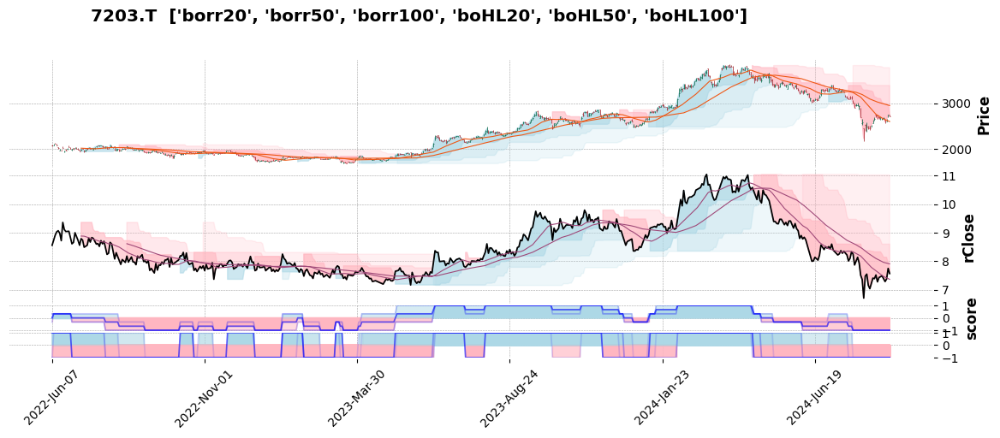

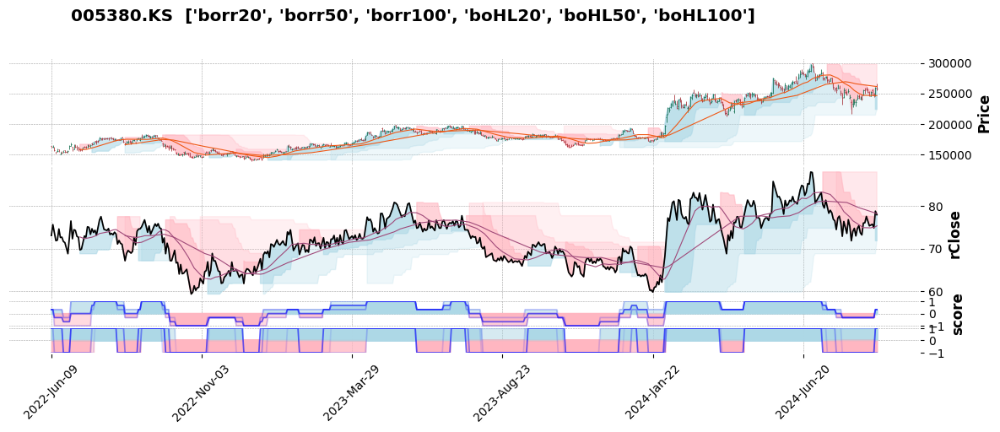

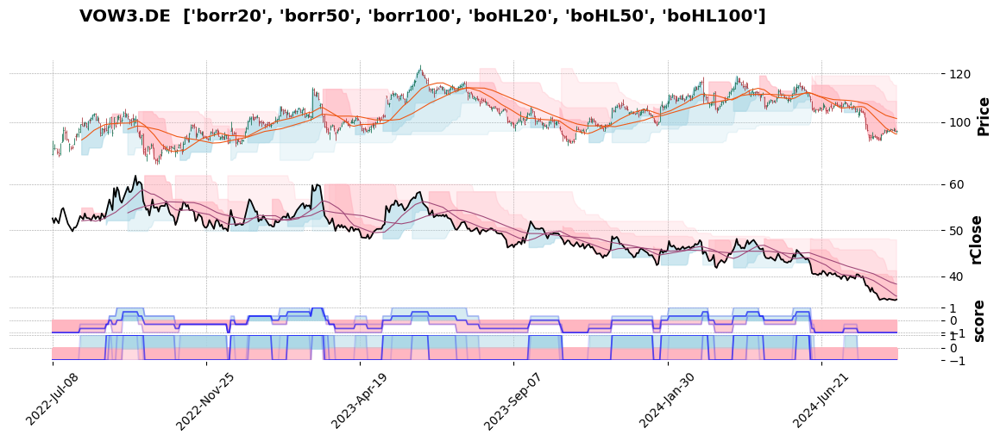

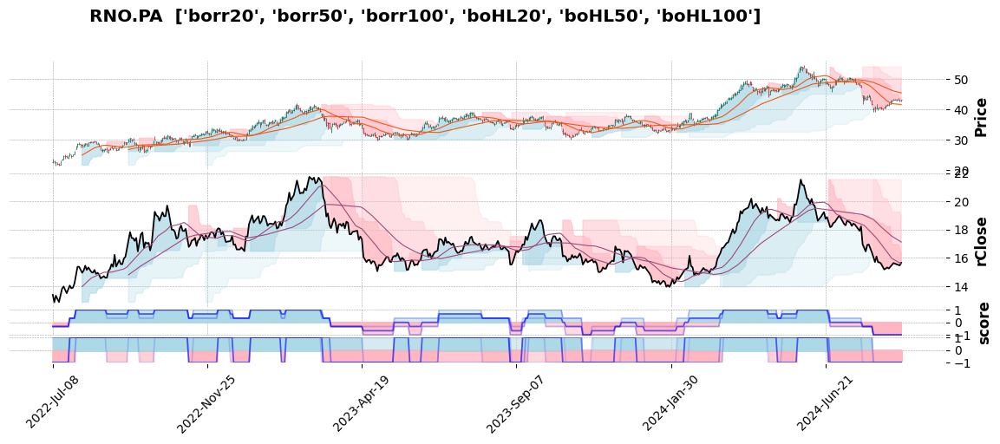

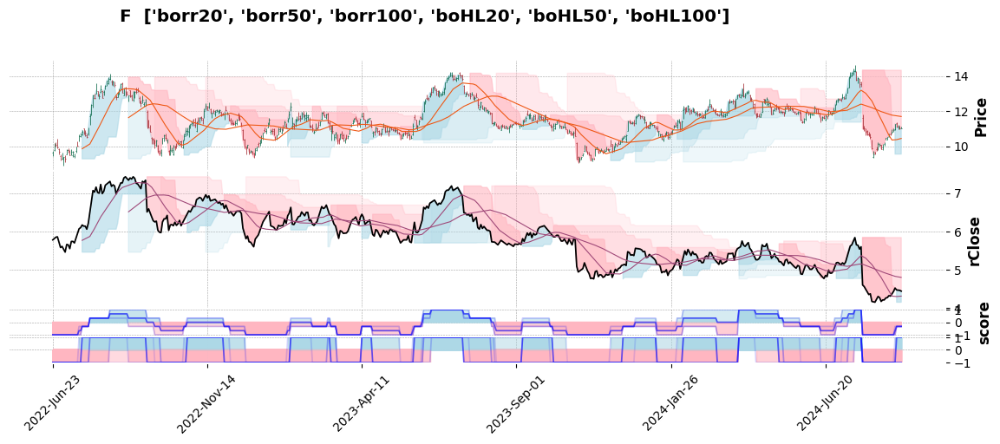

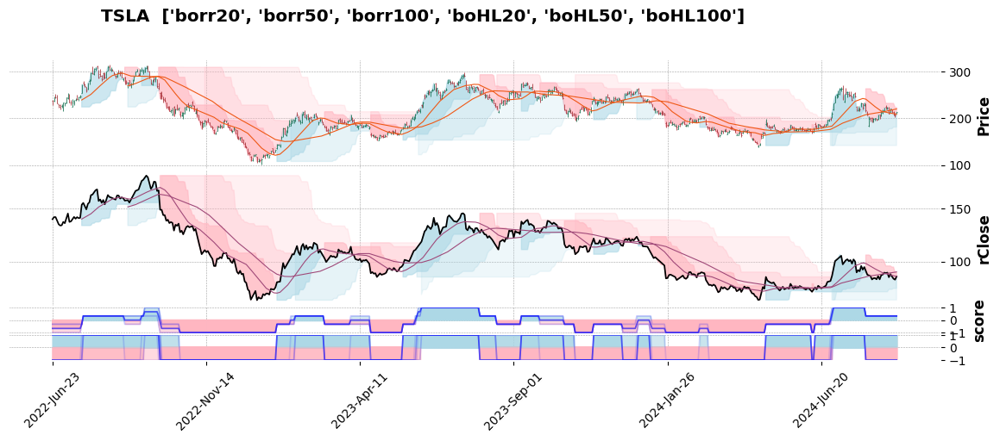

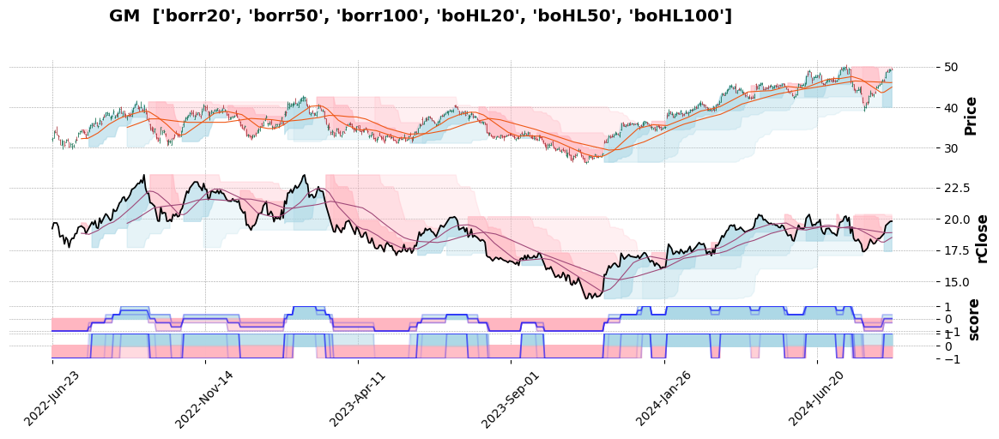

,Close,score,score_abs,score_rel,boHL100,boHL20,boHL50,borr100,borr20,borr50
ticker,,,,,,,,,,
005380.KS,258500.00,0.33,0.33,0.33,1.0,1.0,-1.0,1.0,1.0,-1.0
TSLA,213.79,0.33,0.33,0.33,1.0,-1.0,1.0,1.0,-1.0,1.0
GM,49.26,0.00,0.33,-0.33,1.0,1.0,-1.0,-1.0,1.0,-1.0
F,11.03,-0.33,-0.33,-0.33,-1.0,1.0,-1.0,-1.0,1.0,-1.0
7203.T,2720.50,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
RNO.PA,43.16,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [8]:
last_row_list= [] ; last_row_df = pd.DataFrame()

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)            
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',]        
        regime_cols += rg_cols        
            
        for t, slt in enumerate(sorted(bo_list)):
            mpf_breakout(price_dict[ticker][start_mpf:], color_bull, color_bear, alfa/(t+1), pane, slt, field=f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}')
            fields_list.append(f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}')        
        pane = 0     
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3) 
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
                addplot= subplots,  panel_ratios = (2,2.5,0.5,0.5),)
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 6. Turtle for dummies
Turtle is an asymmetrical range breakout strategy:
1. Enter on longer duration: lt
2. Exit on shorter duration: st


In [9]:
def turtle_trader(df, _h, _l, st, lt):
    '''
    _lt: Long/Short direction
    _st: trailing stop loss
    '''
    _lt = regime_breakout(df,_h,_l,lt)
    _st = regime_breakout(df,_h,_l,st)
    turtle = pd. Series(index= df.index, 
                        data = np.where(_lt == 1,np.where(_st == 1,1,0), 
                                np.where(_lt == -1, np.where(_st ==-1,-1,0),0)))
    return turtle

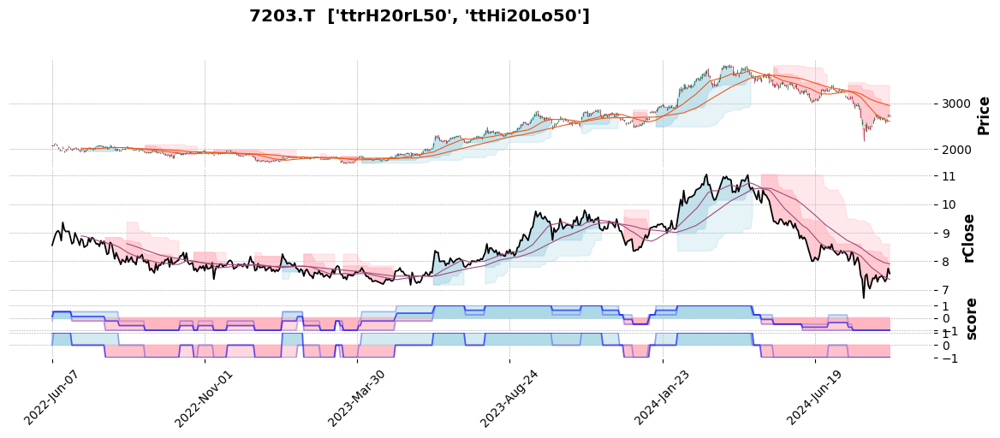

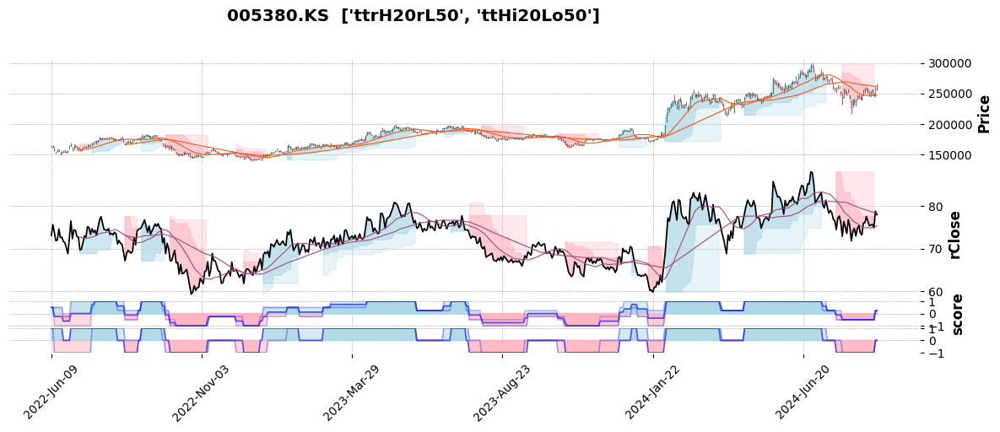

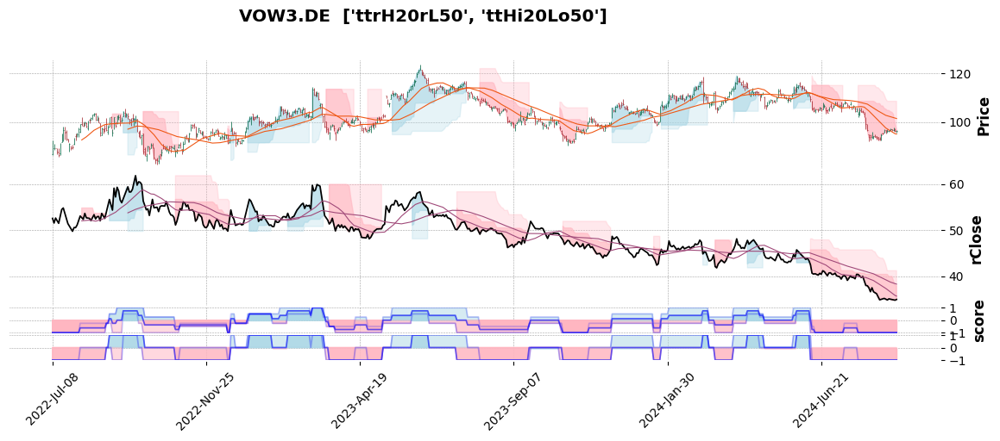

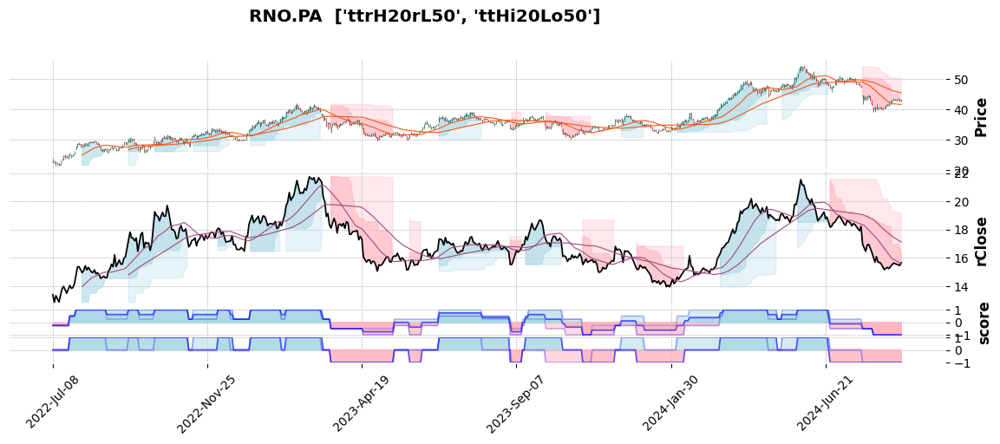

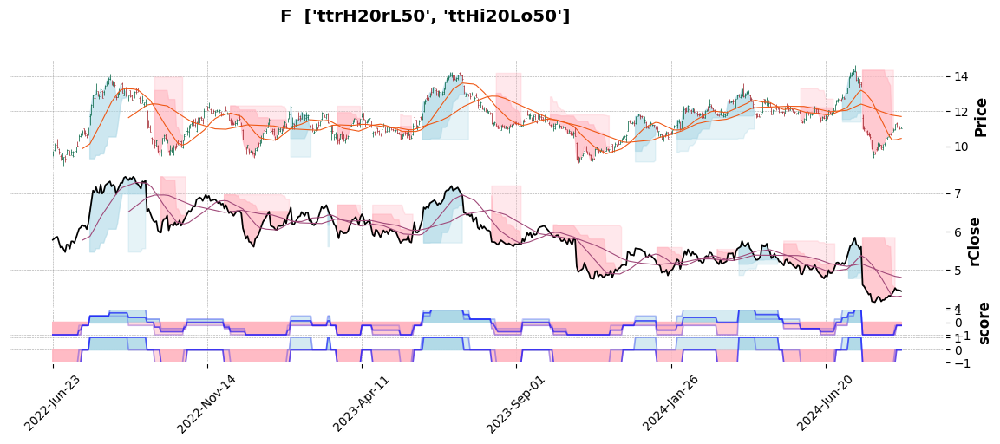

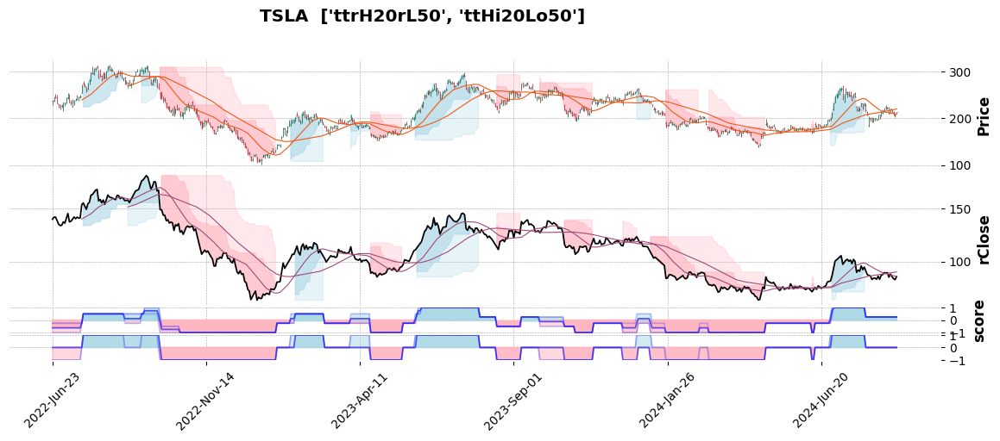

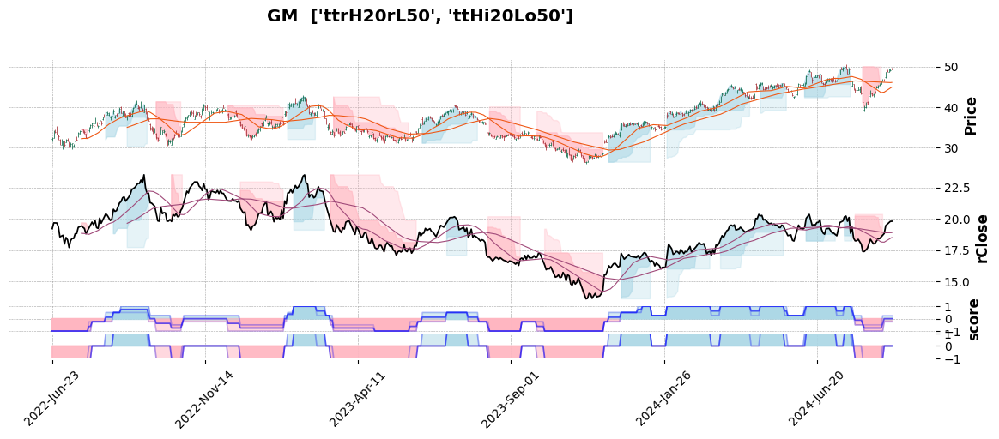

,Close,score,score_abs,score_rel,boHL100,boHL20,boHL50,borr100,borr20,borr50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,
005380.KS,258500.00,0.25,0.25,0.25,1.0,1.0,-1.0,1.0,1.0,-1.0,0,0
TSLA,213.79,0.25,0.25,0.25,1.0,-1.0,1.0,1.0,-1.0,1.0,0,0
GM,49.26,0.00,0.25,-0.25,1.0,1.0,-1.0,-1.0,1.0,-1.0,0,0
F,11.03,-0.25,-0.25,-0.25,-1.0,1.0,-1.0,-1.0,1.0,-1.0,0,0
7203.T,2720.50,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
RNO.PA,43.16,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1


In [10]:
last_row_list= [] ; last_row_df = pd.DataFrame()

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',]         
        regime_cols += rg_cols        
        
        mpf_turtle(price_dict[ticker][start_mpf:], st, lt, color_bull, color_bear, alfa, pane, field= f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}')
        fields_list.append(f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}')
        pane = 0   
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3) 
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
                addplot= subplots,  panel_ratios = (2,2.5,0.5,0.5),)
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 7. Moving average crossover
1. regime_sma: simple moving average crossover strategy
    1. Bullish: st > mt = 1
    2. Bearish: st < mt = -1
2. regime_ema: exponential moving average crossover strategy
    1. Bullish: st > mt = 1
    2. Bearish: st < mt = -1

In [11]:
def regime_sma(df,_c,st,lt):
    sma_lt = df[_c].rolling(lt).mean()
    sma_st = df[_c].rolling(st).mean()
    rg_sma = np.sign(sma_st - sma_lt)
    return rg_sma

def regime_ema(df,_c,st,lt):
    ema_st = df[_c].ewm(span=st,min_periods = st).mean()
    ema_lt = df[_c].ewm(span=lt,min_periods = lt).mean()
    rg_ema = np.sign(ema_st - ema_lt)
    return rg_ema

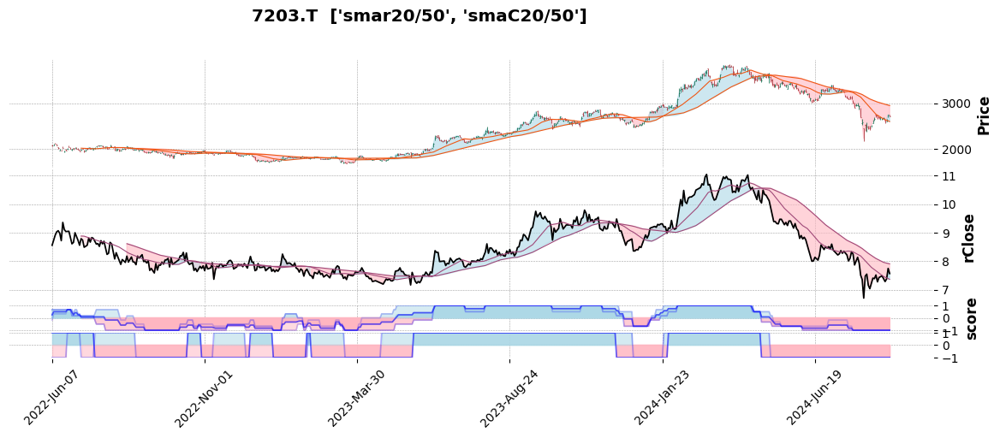

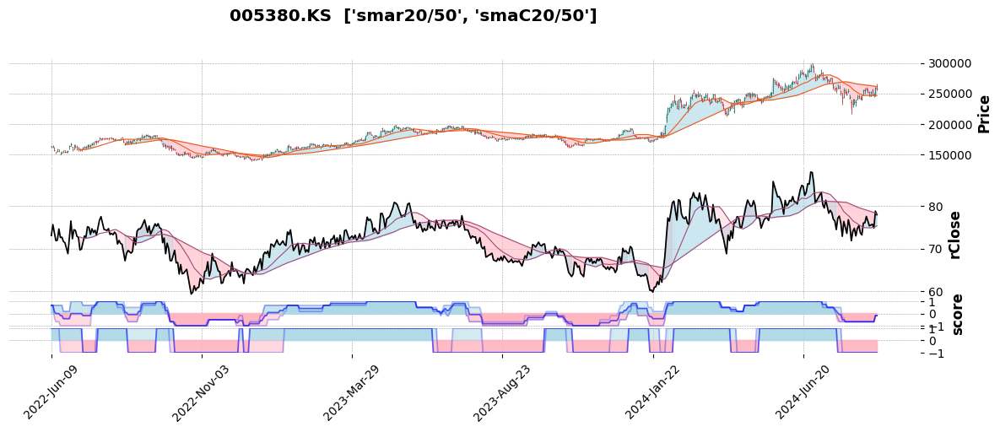

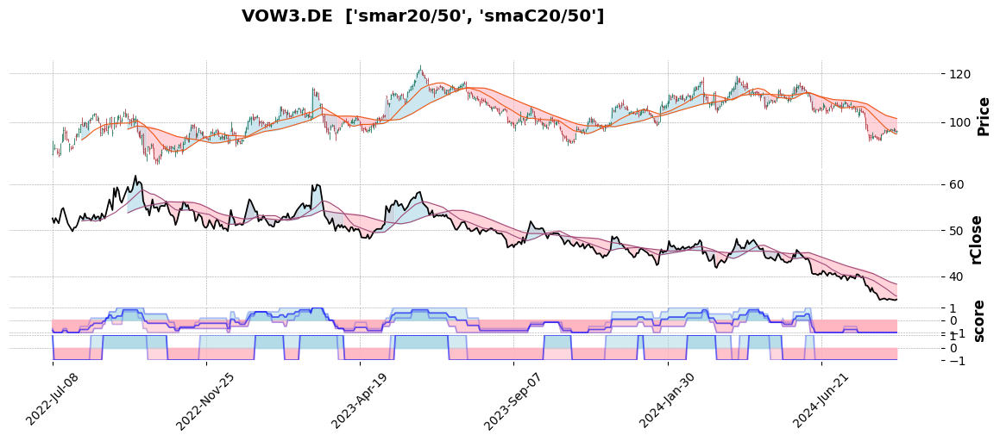

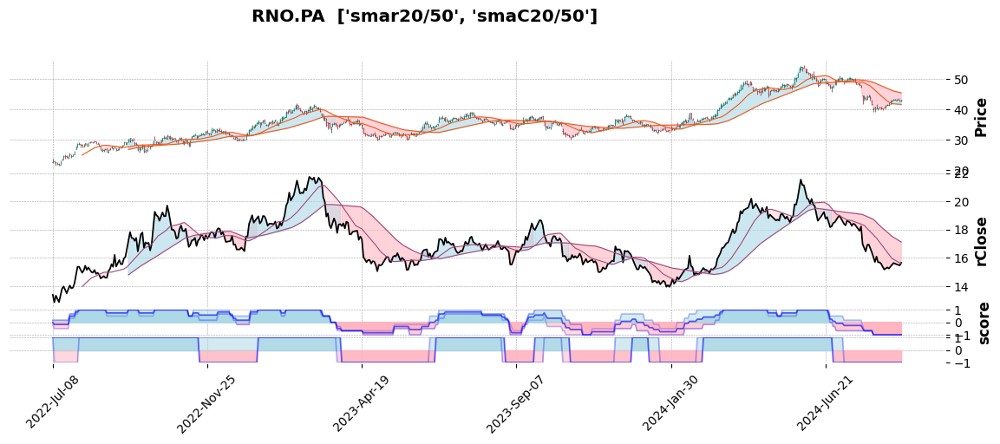

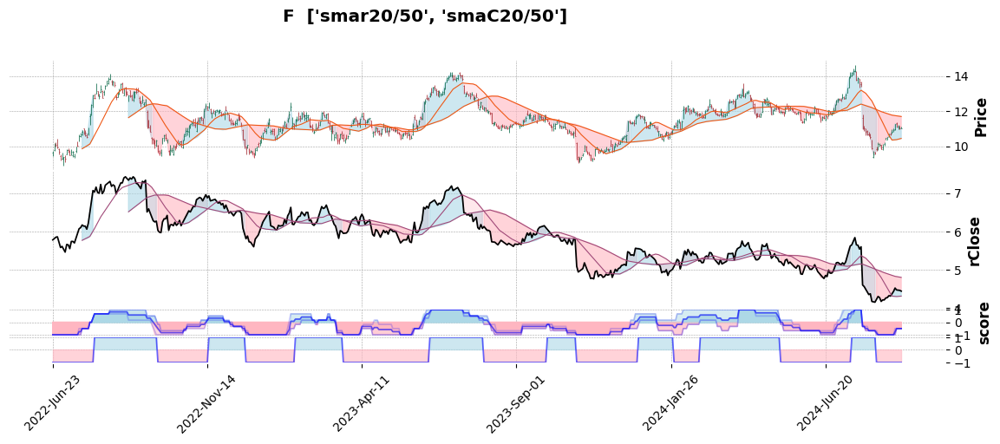

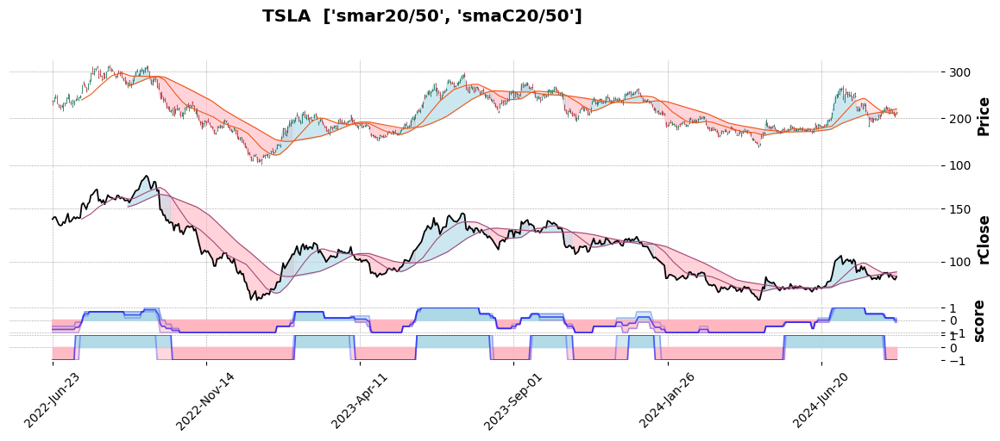

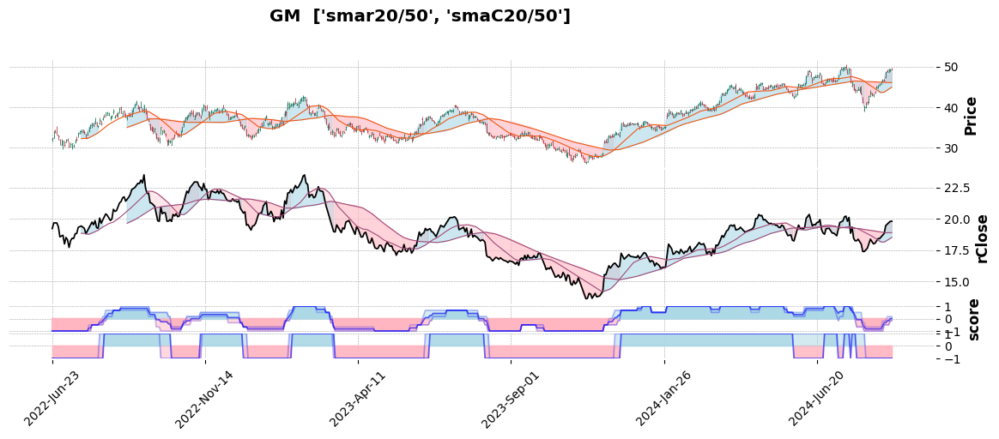

,Close,score,score_abs,score_rel,boHL100,boHL20,boHL50,borr100,borr20,borr50,emaC20/50,emar20/50,smaC20/50,smar20/50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,,,,,
TSLA,213.79,0.00,0.17,-0.17,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,0,0
GM,49.26,0.00,0.17,-0.17,1.0,1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,0,0
005380.KS,258500.00,-0.17,-0.17,-0.17,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0
F,11.03,-0.50,-0.50,-0.50,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0
7203.T,2720.50,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
RNO.PA,43.16,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1


In [12]:
last_row_list= [] ; last_row_df = pd.DataFrame()

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
        price_dict[ticker][f'sma{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_sma(price_dict[ticker], _c, st, lt)
        price_dict[ticker][f'ema{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_ema(price_dict[ticker], _c, st, lt)
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',
                   f'sma{str(_c)[:1]}{str(st)}/{str(lt)}',f'ema{str(_c)[:1]}{str(st)}/{str(lt)}',]       
        regime_cols += rg_cols        
                    
        mpf_sma(price_dict[ticker][start_mpf:], st, lt, color_bull, color_bear, alfa, pane, field= f'sma{str(_c)[:1]}{str(st)}/{str(lt)}')
        fields_list.append(f'sma{str(_c)[:1]}{str(st)}/{str(lt)}')
        pane = 0
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3) 
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
                addplot= subplots,  panel_ratios = (2,2.5,0.5,0.5),)
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 8. Fractals

The next two regime definition methodologies rely on swing highs and lows. The following methodology is inspired from the seminal work of Belgian mathematician Benoit Mandelbrot on fractals. We zoom out from the smallest infractuosity to the larger patterns. 
1. We first calculate the average of H,L,C to have a unique data series
2. A Fractal high is a high surrounded by 2 immediate lower highs. A fractal low is a low surrounded by 2 higher lows
3. We iterate through the fractals. Level 1 uses average price. Level 2 uses level 1 series. Level 3 uses level 2 etc

Now let's go through the functions. 

1. def fractal(px, lvl):

This function identifies fractals at all levels. At the first level, it filters out the noise. Past the first level, fractals up are surrounded by lows & highs. We therefore need to look at n-2 and n+2 to identify the next level fractals. This function is inserted into the next one

2. def fractal_df(df,_h,_l,_c):
This function builds on the previous one. 

    1. Copy the main df, calculate the average price [_h,_l,_c] to ensure the unicity of the series. Create a hilo series
    2. Loop through as long as the hilo df is longer than 3. Separate lows and highs by assigning a negative value to the series.
    3. First pass of the fractal function over the highs and lows
    4. Join the highs and lows by adding them and drop Nan values
    5. Second pass of the fractal function at level one to filter out the noise and guaranty we only keep extremes
    6. Copy the values to the reduction dataframe
    7. Copy the reduction dataframe to the main dataframe
    8. Build a continuous Highs Lows columns with fillna method


In [13]:
def fractal(px, lvl):
    max_lvl = np.minimum(2,lvl)
    fractal = px[(px<= px.shift(-1)) & (px < px.shift(+1)) &
                 (px<= px.shift(- max_lvl)) & (px < px.shift(+ max_lvl))]
    return fractal

def fractal_df(df,_h,_l,_c): 
    fillna_list = []
    reduction = df[[_h,_l,_c]].copy() 
    reduction['avg_px'] = round(reduction[[_h,_l,_c]].mean(axis=1),3)
    hilo = reduction['avg_px'] 
    n= 1
    while len(hilo) >= 3: 
        lows = fractal(px= hilo, lvl = n)
        last_low = lows[-1:]
        highs = -fractal(px = -hilo, lvl = n)
        last_high = highs[-1:]
        hilo = lows.add(highs,fill_value = 0).dropna()
        
        if (len(hilo) >=2):
            if (last_low.index >  last_high.index):
                lows = pd.concat([fractal(px= hilo, lvl = 1),last_low])
                highs = -fractal(px = -hilo, lvl = 1)
            elif (last_low.index <  last_high.index):
                lows = fractal(px= hilo, lvl = 1)
                highs = pd.concat([-fractal(px = -hilo, lvl = 1),last_high])     
                
            hilo = lows.add(highs,fill_value = 0).dropna()
            reduction[f'{str(_l)[:2]}{str(n)}'] = lows
            reduction[f'{str(_h)[:2]}{str(n)}'] = highs
            reduction[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}'] = hilo
            df[f'{str(_l)[:2]}{str(n)}'] = reduction[f'{str(_l)[:2]}{str(n)}']
            df[f'{str(_h)[:2]}{str(n)}'] = reduction[f'{str(_h)[:2]}{str(n)}']
            df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}'] = reduction[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}']
        
        elif (len(highs)==0):    
            df[f'{str(_l)[:2]}{str(n)}'] = last_low
            df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}'] = last_low
            
        elif (len(lows)==0):
            df[f'{str(_h)[:2]}{str(n)}'] = last_high
            df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}'] = last_high
        fillna_list += [f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}']
        n+=1 
        
    df[fillna_list] = df[fillna_list].ffill()
    df.dropna(how = 'all', axis =1, inplace=True)
    return df

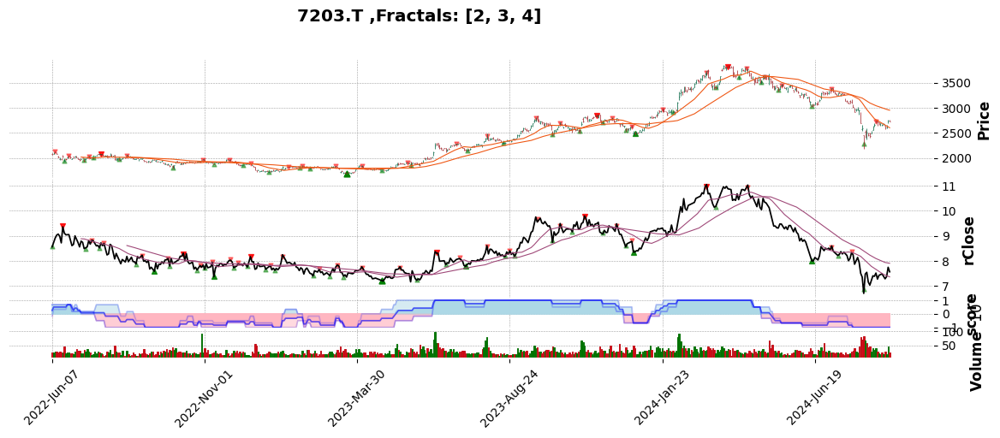

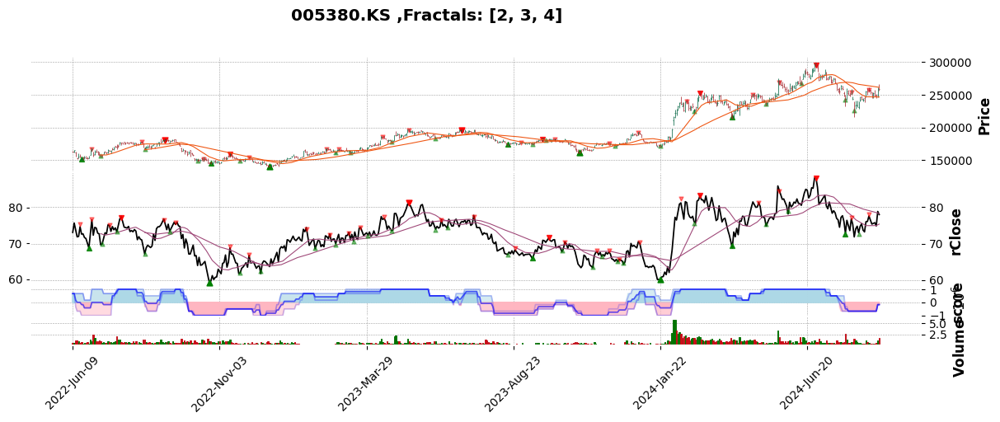

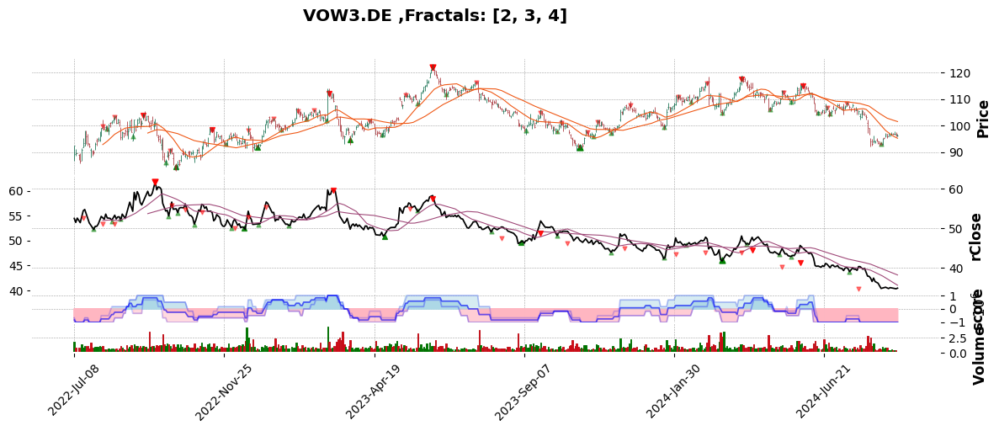

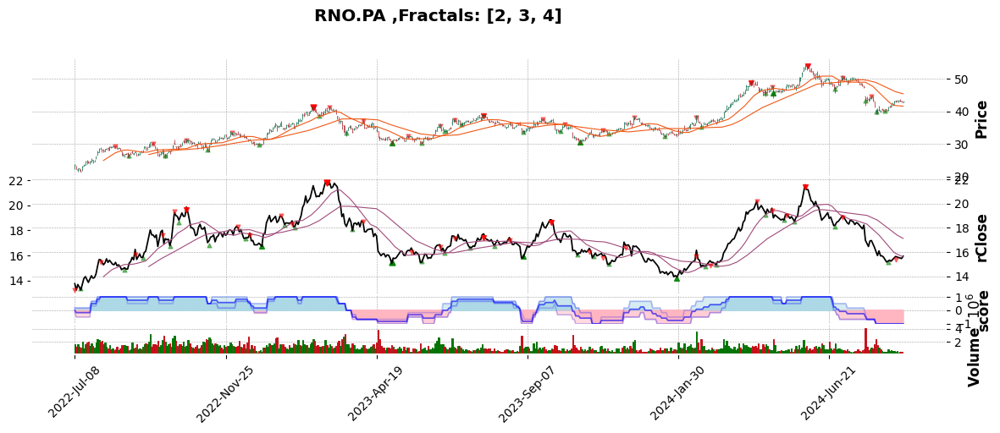

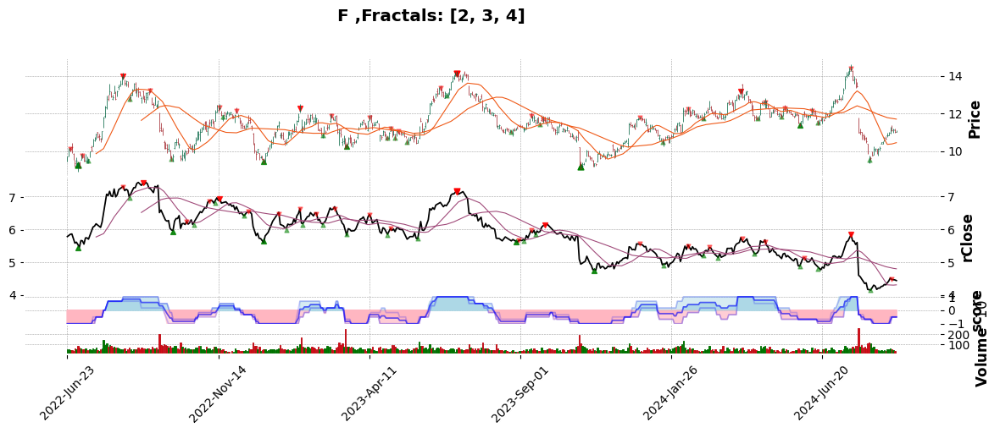

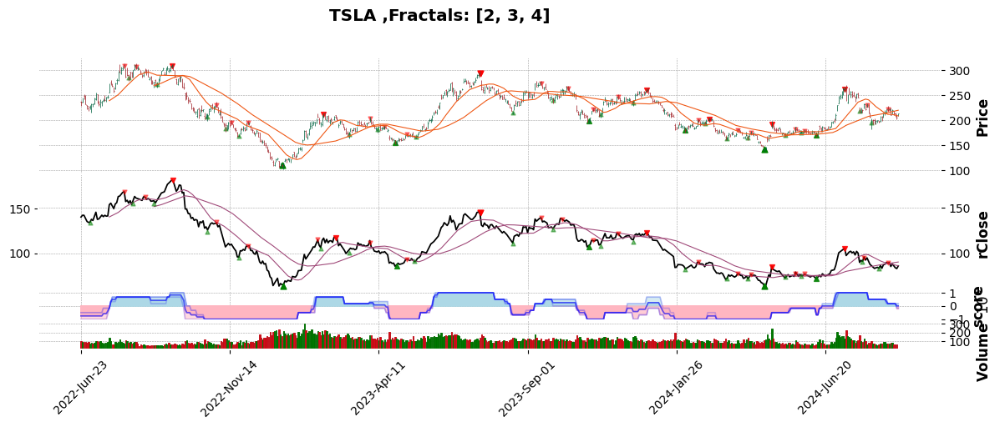

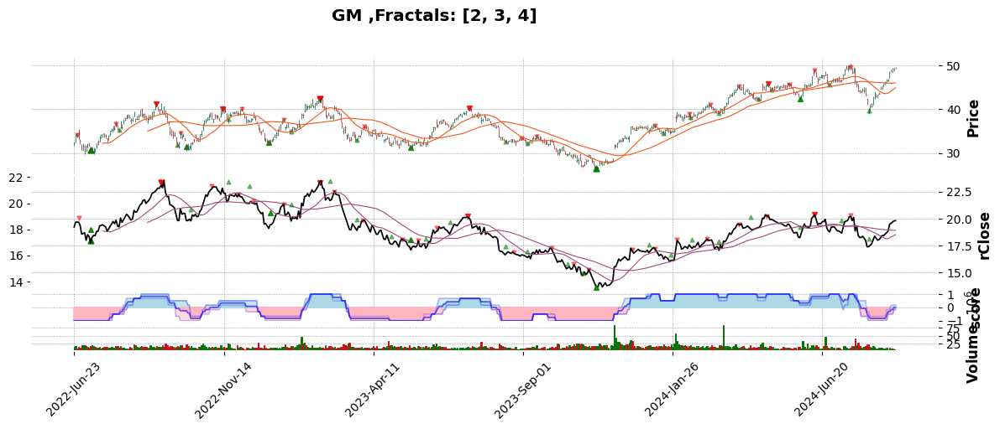

,Close,score,score_abs,score_rel,boHL100,boHL20,boHL50,borr100,borr20,borr50,emaC20/50,emar20/50,smaC20/50,smar20/50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,,,,,
TSLA,213.79,0.00,0.17,-0.17,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,0,0
GM,49.26,0.00,0.17,-0.17,1.0,1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,0,0
005380.KS,258500.00,-0.17,-0.17,-0.17,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0
F,11.03,-0.50,-0.50,-0.50,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0
7203.T,2720.50,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1
RNO.PA,43.16,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1,-1


In [14]:
last_row_list= [] ; last_row_df = pd.DataFrame() ; fractals_list= [2, 3, 4]

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
        price_dict[ticker][f'sma{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_sma(price_dict[ticker], _c, st, lt)
        price_dict[ticker][f'ema{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_ema(price_dict[ticker], _c, st, lt)
        fractal_df(price_dict[ticker],_h,_l,_c)
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',
                   f'sma{str(_c)[:1]}{str(st)}/{str(lt)}',f'ema{str(_c)[:1]}{str(st)}/{str(lt)}',]       
        regime_cols += rg_cols   
        
        mpf_fractals(price_dict[ticker][start_mpf:], fractals_list, color_up, color_down, size, pane)
        pane = 0
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3)     
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker} ,Fractals: {fractals_list}', 
             mav = tuple(sorted(sma_list)), addplot= subplots, 
     volume= True, volume_panel = 3, panel_ratios = (2,2,0.5,0.5),)   
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 9. Higher Highs Higher Lows

This is a classic regime definition methodology. When the market prints higher highs and higher lows, regime is bullish. Conversely, when the market prints lower lows and lower highs, regime is bearish. The theory makes intuitive sense. In practice, things are slightly more ocmplicated

1. Markets tend to be noisy, the market does not always follow a neat succession of higher highs, higher lows. Should the regime drop to neutral to reflect the uncertainty, or continue until the conditions for a reversal are met? We privilege stability over accuracy. It is more profitable to be about right than exactly wrong. So, regime stays on until reversal
2. In the case of an ongoing trend, do we set the lower low/higher low at the onset of a trend or do we keep trailing? This is again an offshoot of noisy markets. Leaving the lower low or higher at the inital level may be flattering but in practice, prudent risk management dictates traders may pay attention to market gyrations.
2. This is a continutation from the previous reset level. False positives happens when price drops below higher lows or rise above the  lower highs on the bullish and bearish sides, respectively. This can either be temporary or an early sign of an imminent regime change. The prudent thing to do is change regime and revert if the price resumes its original trajectory. The regime definition gives the choice between either the latest low/high or the previous one. The default is previous swing. This gives more stability to the regime definition 


3. hihilolo(df,_h,_l,_c,lvl,shft= 2):
This function uses the fractals to find higher highs, higher lows & lower lows, lower highs. 

    1. Create a df lh for lows highs
    3. Loop through each level. Separate lows and highs by assigning a negative value to the series.
    4. bullish conditions: 1. low 2. low preceded by high 3. higher high 4.higher low
    5. bearish conditions: 1. high 2. high preceded by low 3. lower low 4. lower high
    6. Assign low/high: note that we default to the previous low/high by shifting 2 values back
    7. Slice lh df, drop one column
    8. Join lh with the main df, propagate values using forward fill
    9. Calculate the sign of the difference between the close price and the hilo values
        1. when close is above hl, regime is bullish
        2. when close is below hl, regime is bearish


4. def regime_blend(df,_h,_l,_c, lvl,rg_dict):
This function combines all fractal regimes into a blended score. This can be either equal weight or weighted average. This function is particularly useful for position sizing. 
Not all levels are born equal. Level 1 is particularly noisy. A bear market at level 1 could be a mere pullback at level 2 and so on and so forth. Level 2 is suitable for trading. Level 3 is more infrequent. How you decide to weig each level is ultimately your choice. When the pullback is over and level 2 & 3 are aligned, reload.

5. def fractals_HH(df, lvl, rg_dict, suffix,rel= False): 
This function calls all the functions necessary to calculate higher highs higher lows regime in both absolute and relative


In [15]:
def hihilolo(df,_h,_l,_c,shft= 2):
    n=1
    while (f'{str(_h)[:2]}{str(n)}' in df.columns) & (f'{str(_l)[:2]}{str(n)}' in df.columns):
        lh = pd.DataFrame()
        hhll = f'{str(_h)[:1]}{str(_h)[:1]}{str(_l)[:1]}{str(_l)[:1]}'
        lhv = f'{str(_l)[:2]}{str(_h)[:2]}{str(n)}'
        lh[lhv] = df[f'{str(_l)[:2]}{str(n)}'].sub(df[f'{str(_h)[:2]}{str(n)}'],fill_value =0).dropna()
        lh.loc[(np.sign(lh[lhv]) < 0) & 
            (np.sign(lh[lhv] * lh[lhv].shift()) < 0) & 
            (-lh[lhv] < -lh[lhv].shift(2)) & 
            (lh[lhv].shift(1) < lh[lhv].shift(3)), hhll+str(n)] = -lh[lhv].shift(shft)
        lh.loc[(np.sign(lh[lhv])>0) & 
            (np.sign(lh[lhv] * lh[lhv].shift()) < 0) & 
            (lh[lhv] > lh[lhv].shift(2)) & 
            (-lh[lhv].shift(1) > -lh[lhv].shift(3)), hhll+str(n)] = lh[lhv].shift(shft)
        lh = lh.dropna(subset = [hhll +str(n)])
        
        df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}_hl'] = lh[f'{hhll}{str(n)}']
        df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}_hl'] = df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}_hl'].ffill()
        df[f'{str(_h)[:2]}{str(_l)[:2]}_HH{str(n)}' ] = np.sign(df[_c].sub(df[f'{str(_h)[:2]}{str(_l)[:2]}{str(n)}_hl'],fill_value=0))
        n+=1
    return df

def regime_blend(df,_h,_l,_c, rg_dict, suffix):
    ''' 
    Weighted average of all fractals
    example: rg_dict = {2:0.3, 3:0.3, 4:0.4, 5 : 0.0 }
    '''    
    blend = np.zeros(len(df))
    if len(rg_dict) > 1:
        v = min(rg_dict)    
        while v <= max(rg_dict):
            if f'{str(_h)[:2]}{str(_l)[:2]}{suffix}{str(v)}' in df.columns:
                blend += df[f'{str(_h)[:2]}{str(_l)[:2]}{suffix}{str(v)}'] * rg_dict[v] / sum(rg_dict.values())
            v +=1
            
    elif len(rg_dict) == 0:
        v= 2; count_v = 0
        while f'{str(_h)[:2]}{str(_l)[:2]}{suffix}{str(v)}' in df.columns:
            blend += df[f'{str(_h)[:2]}{str(_l)[:2]}{suffix}{str(v)}']
            v+=1
            count_v += 1
        blend = blend / count_v
    return round(blend,2)

def fractals_HH(df, rel, rg_dict= {1:0.2, 2:0.6, 3:0.1, 4:0}, suffix= '_HH'):
    _o,_h,_l,_c = rohlc(df,relative= rel)
    hihilolo(df,_h,_l,_c,shft= 2)
    df[f'{str(_h)[:2]}{str(_l)[:2]}{suffix}'] = regime_blend(df,_h,_l,_c, rg_dict, suffix)
    return df

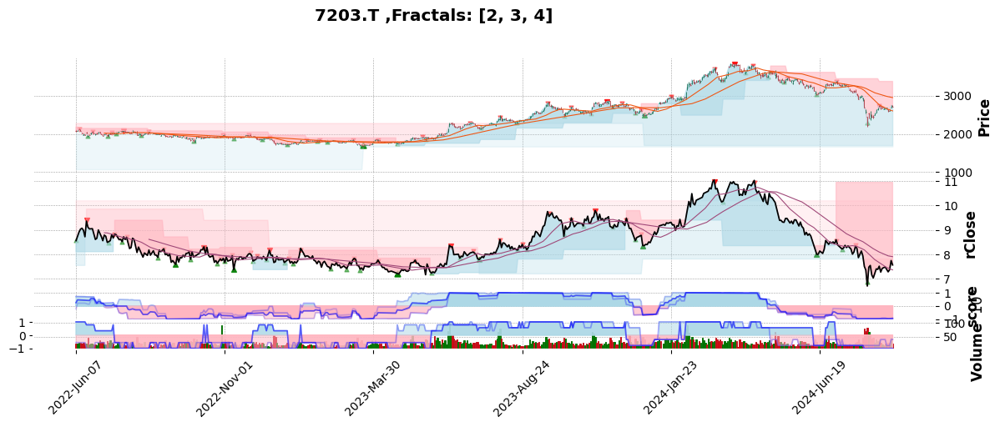

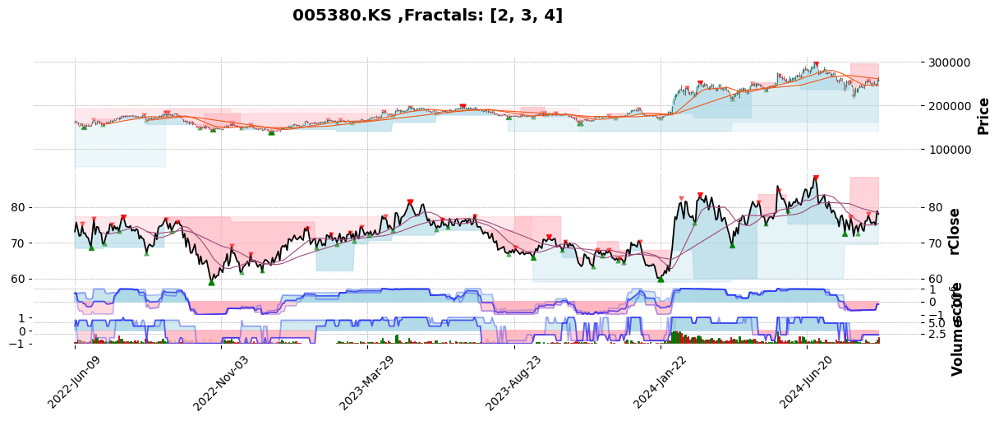

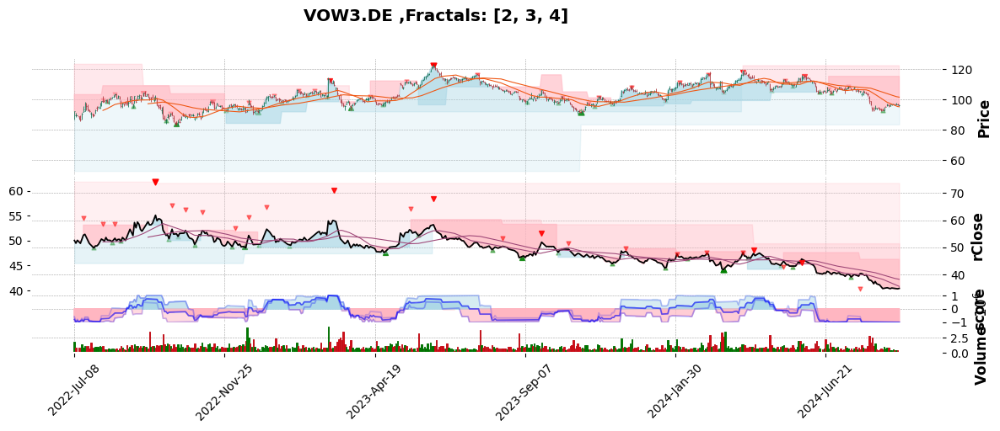

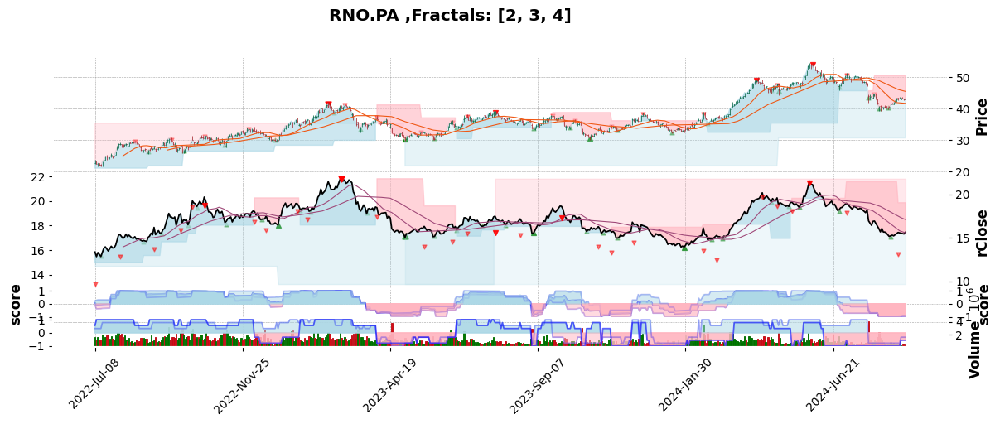

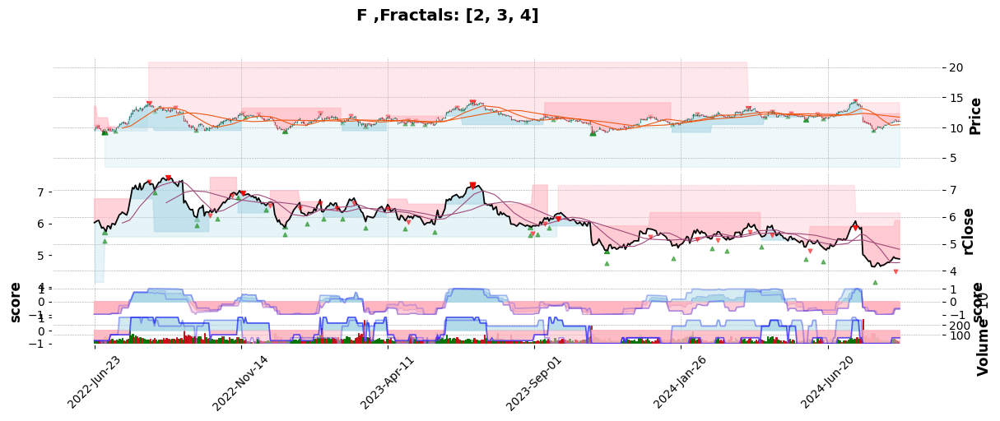

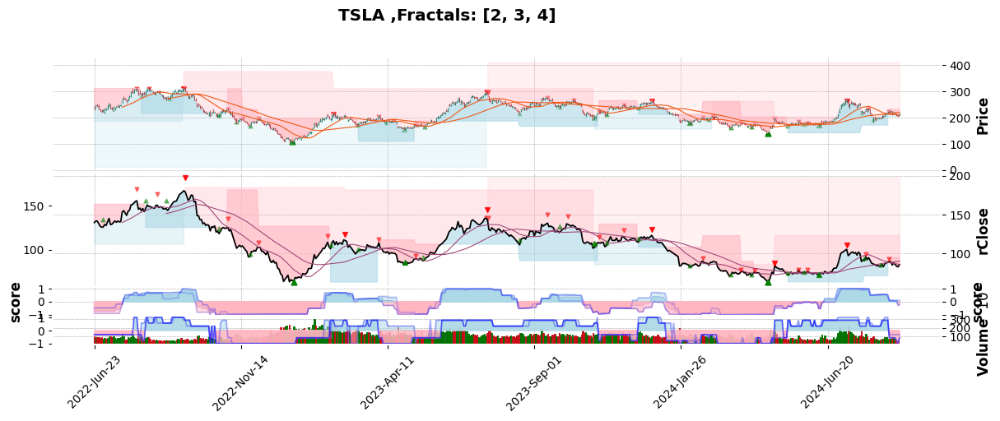

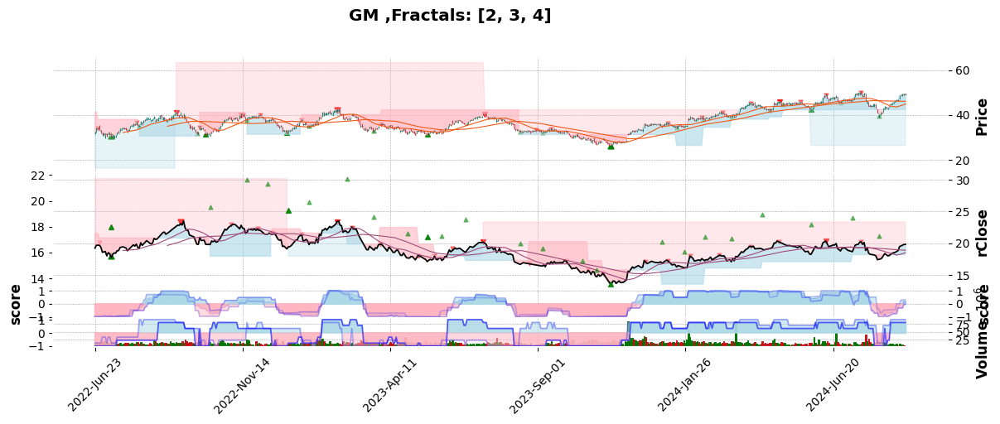

,Close,score,score_abs,score_rel,HiLo_HH,boHL100,boHL20,boHL50,borr100,borr20,borr50,emaC20/50,emar20/50,rHrL_HH,smaC20/50,smar20/50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,,,,,,,
GM,49.26,0.13,0.29,-0.03,1.00,1.0,1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,0.78,-1.0,-1.0,0,0
TSLA,213.79,-0.06,0.10,-0.22,-0.33,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-0.56,-1.0,-1.0,0,0
005380.KS,258500.00,-0.19,-0.19,-0.19,-0.33,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-0.33,-1.0,-1.0,0,0
F,11.03,-0.54,-0.57,-0.51,-1.00,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,-0.56,-1.0,-1.0,0,0
RNO.PA,43.16,-0.92,-0.90,-0.94,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.56,-1.0,-1.0,-1,-1
7203.T,2720.50,-0.95,-0.90,-1.00,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.00,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.00,-1.0,-1.0,-1,-1


In [16]:
last_row_list= [] ; last_row_df = pd.DataFrame() ; fractals_list= [2, 3, 4]

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
        price_dict[ticker][f'sma{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_sma(price_dict[ticker], _c, st, lt)
        price_dict[ticker][f'ema{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_ema(price_dict[ticker], _c, st, lt)
        fractal_df(price_dict[ticker],_h,_l,_c)
        fractals_HH(price_dict[ticker], rel, rg_dict= {1:0.2, 2:0.6, 3:0.1, 4:0}, suffix= '_HH')
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',
                   f'sma{str(_c)[:1]}{str(st)}/{str(lt)}',f'ema{str(_c)[:1]}{str(st)}/{str(lt)}',
                   f'{str(_h)[:2]}{str(_l)[:2]}_HH',]             
        regime_cols += rg_cols        
                    
        mpf_fractals(price_dict[ticker][start_mpf:], fractals_list, color_up, color_down, size, pane)
        mpf_fractals_fill(price_dict[ticker][start_mpf:], fractals_list, alfa, color_bull, color_bear, pane,y_suffix= '_hl', rg_suffix= '_HH')
        fields_list.append(f'{str(_h)[:2]}{str(_l)[:2]}_HH')
        pane = 0
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3)     
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker} ,Fractals: {fractals_list}', 
             mav = tuple(sorted(sma_list)), addplot= subplots, 
     volume= True, volume_panel = 3, panel_ratios = (2,2,0.5,0.5),)   
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 10. Floor/Ceiling Regime: the fractals method

The Floor/Ceiling regime is intuitive, yet computationally expensive. Conceptually speaking, it looks like the right shoulder of the classic head and shoulder pattern at every level, zooming out. We start with the average edaily price and end up with bullish/bearish regime 3-4 levels higher. The beauty of this method is its integrity from the smallest timeframe all the way up to weekly bars. Time unfolds like a Matryoshka, i-e a Russian nested doll. With this methodology, it is possible to identify the 5mn bar at which point the entire market turned bullish/bearish.


1. We calculate the fractals: one high bar immediately surrounded by two lower bars for a fractal up and vice versa for a fractal down.At the smallest timeframe, markets are noisy. We use this series to filter out the daily randomness of price 
2. We reduce the dataframe to those fractals and repeat the process over the filtered series. We ensure alternation: a high is preceded and followed by a low. Each highand low constitutes a floor and ceiling.
3. Every level reflects a different aspect of the market: 
    1. Level 2 (twice filtered from the actual price): reveals swing highs & lows. Those series are noisy, but suited to small capitalisation traders who want to take advantage of price action
    2. Level 3 (3 times filtered from the actual price): shows momentum lasting over multiple swings. Those series are more suited to less active trend following participants, with more wiggle room for drawdowns and higher uypside potential. 
    3. Level 4 (4 times filtered from the actual price): defines bull/bear regime. This infrequent level lags behind all prior fractals. This is suited for market participants who want to capture large inflections. In the relative series Long/Short space, this is the ideal timeframe for sector rotation. Market participants will stomach volatility but stay the course for months and years. 

Now, let's go over the functions. 

3. def fractal_date_df(df,_h,_l,_c, lvl):
This function identifies the bar at which a higher level fractal is detected. In theory, it can identify the 1 minute bar at which a daily bar market turned bullish/bearish. This is the Matryoshka, i-e a Russian nested doll. The logic may be intuitive, yet the computation is anything but trivial. So, let's go through the logic first, then we will go the code implementation:
    1. A fractal 1 requiress 3 HLC prices: 1 peak/trough surrounded by 2 lower/higher datapoints
    2. A fractal 2 requiress 3 fractals 1: 1 peak/trough surrounded by 2 lower/higher datapoints
    3. A fractal 3 requiress 3 fractals 2: 1 peak/trough surrounded by 2 lower/higher datapoints
    4. A fractal 4 requiress 3 fractals 3: 1 peak/trough surrounded by 2 lower/higher datapoints, etc.
So, for a level 5 to be detected, we need all the lower levels to be discovered, all the way down to the price action that triggered the level 1. This function identifies the bar after the peak/trough HLC series that will trigger a fractal 1. This will produce a fractal 2, that will generate a fractal 3 and so on. It is a gradual process of elimination of all the intermediate fractals leading to higher fractals. This is why level 3-4-5 fractals are discovered months later. The logic is relatively simple. Now, let's go through the code
1. we create an average HLC series to ensure unicity of datapoints
2. We shift the series one row back hilos['fwd']: bring today's price to yesterday's row. This subterfuge will allow us to work level 1 series and shift price back to the following day when the process is complete
3. We fillna forward and eliminate all level 1 not preceded by a level 2 and above. That leaves all level 1 and and level 1 and beyond. 
4. Beyond level 2, things get a little more complicated. Remember that we want to keep the level 1 leading up to level [n] & level [n] is surrounded by level [n-1]. We therefore need to eliminate the level[n-1] but keep the level 1 leading up to it. 
5. We repeat the process twice, once for the highs, once for the lows.
6. Once the process is complete, we add fractals highs and lows into two columns per level:
    1. _fc: fractal at each level
    2. _ch: bar on which this level was discovered
    
4. def regime_FC_df(df,_h,_l,_c, lvl): 
This is calculation for the floor/ceiling regime at each level. This is the sign of the difference between the '_ch' line and the 2 day moving average HLC price. 
    1. Bullish +1: price is above the '_ch' line. It can be either in an uptrend or a violation of a downtrend
    2. Bearish -1: price is below the '_ch' line. It can be either in a downtrend or a violation of an uptrend
    
5. def fractals_FC(df, lvl, suffix = '_FC', rg_dict= {1:0, 2:0.5, 3:0.4, 4:0.1}, rg_ch_dt = False, rel= False):
This function packages all the above functions into one neat function. The Boolean rg_ch_dt flag is set to False. Set it to True only if you need to know precisely when regime shifted. 


In [18]:

def fractal_date_df(df,_h,_l,_c):
    fillna_list = []
    avg_px = f'{str(_h)[:2]}{str(_l)[:2]}{str(_c)[:2]}'
    for hl in [_h,_l]:
        hilos = df.copy()
        hilos[avg_px] = hilos[[_h,_l,_c]].mean(axis =1).round(3)
        hilos['fwd'] = hilos[avg_px].shift(-1)

        hilos = hilos[hilos[f'{str(hl)[:2]}{str(1)}'] > 0]
        df[f'{str(hl)[:2]}{str(1)}_ch'] = hilos['fwd']
        df[f'{str(hl)[:2]}{str(1)}_ch'] = df[f'{str(hl)[:2]}{str(1)}_ch'].shift()
        shft = 1
        v = 2
        while (f'{str(hl)[:2]}{str(v)}' in df.columns): # & (v<4):
            hilos[f'{str(hl)[:2]}{str(v)}_filled'] = hilos[f'{str(hl)[:2]}{str(v)}'].ffill()
            hilos.loc[(pd.isnull(hilos[f'{str(hl)[:2]}{str(v)}'].shift(shft))) & 
                    (pd.isnull(hilos[f'{str(hl)[:2]}{str(2)}'])), avg_px] = np.nan
            shft = 3
            
            if v > 2 :
                hilos.loc[(pd.isnull(hilos[f'{str(hl)[:2]}{str(v)}'])) & 
                        (pd.notnull(hilos[f'{str(hl)[:2]}{str(v-1)}'])), avg_px] = np.nan
            hilos = hilos.dropna(subset = avg_px)
            
            df[f'{str(hl)[:2]}{str(v)}_ch'] = hilos.loc[pd.isnull(hilos[f'{str(hl)[:2]}{str(2)}']),'fwd']
            df[f'{str(hl)[:2]}{str(v)}_fc'] = hilos.loc[pd.isnull(hilos[f'{str(hl)[:2]}{str(2)}'] ),f'{str(hl)[:2]}{str(v)}_filled']
            df[[f'{str(hl)[:2]}{str(v)}_ch',f'{str(hl)[:2]}{str(v)}_fc']] = df[[f'{str(hl)[:2]}{str(v)}_ch',f'{str(hl)[:2]}{str(v)}_fc']].shift(1)
        
            if hl == _l:
                fillna_list += [f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_ch', f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_fc']
                if (f'{str(_h)[:2]}{str(v)}' in df.columns) & (f'{str(_l)[:2]}{str(v)}' in df.columns):
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_fc'] = df[f'{str(_h)[:2]}{str(v)}_fc'].add(df[f'{str(_l)[:2]}{str(v)}_fc'], fill_value =0)
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_ch'] = df[f'{str(_h)[:2]}{str(v)}_ch'].add(df[f'{str(_l)[:2]}{str(v)}_ch'], fill_value =0)
                elif (f'{str(_h)[:2]}{str(v)}' in df.columns) & (f'{str(_l)[:2]}{str(v)}' not in df.columns):
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_fc'] = df[f'{str(_h)[:2]}{str(v)}_fc']
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_ch'] = df[f'{str(_h)[:2]}{str(v)}_ch']
                elif (f'{str(_h)[:2] }{str(v)}' not in df.columns) & (f'{str(_l)[:2]}{str(v)}' in df.columns):
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_fc'] = df[f'{str(_l)[:2]}{str(v)}_fc']
                    df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}_ch'] = df[f'{str(_l)[:2]}{str(v)}_ch']
            v+=1
    
    df[fillna_list] = df[fillna_list].ffill() 
    return df

def regime_FC_df(df,_h,_l,_c, rg_ch_dt): 
    if rg_ch_dt:
        rg = '_ch'
    else:
        rg = '_fc'
    v =2
    while f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}' in df.columns:
        if f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}{rg}' in df.columns:             
            df[f'{str(_h)[:2]}{str(_l)[:2]}_FC{str(v)}'] = np.sign(df[[_h,_l,_c]].mean(axis=1).rolling(2).mean().sub( 
                                                                df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}{rg}'],fill_value = 0))
                
        elif f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}' in df.columns:
            df[f'{str(_h)[:2]}{str(_l)[:2]}_FC{str(v)}'] = np.sign(df[[_h,_l,_c]].mean(axis=1).rolling(2).mean().sub(
                                                                df[f'{str(_h)[:2]}{str(_l)[:2]}{str(v)}'], fill_value = 0))           
        v+=1
    return df

def fractals_FC(df, rel, rg_ch_dt = False,rg_dict= {1:0, 2:0.4, 3:0.5, 4:0.1}, suffix = '_FC'):
    '''
    Calls all the functions into one aggregate function
    '''    
    _o,_h,_l,_c = rohlc(df,relative= rel)
    if rg_ch_dt :
        fractal_date_df(df,_h,_l,_c)
    regime_FC_df(df,_h,_l,_c, rg_ch_dt )
    df[f'{str(_h)[:2]}{str(_l)[:2]}{suffix}'] = regime_blend(df,_h,_l,_c, rg_dict, suffix)
    return df

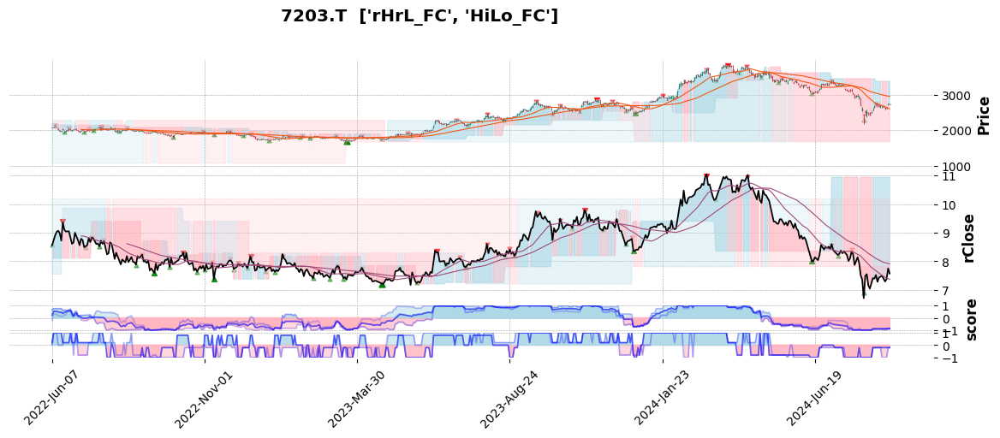

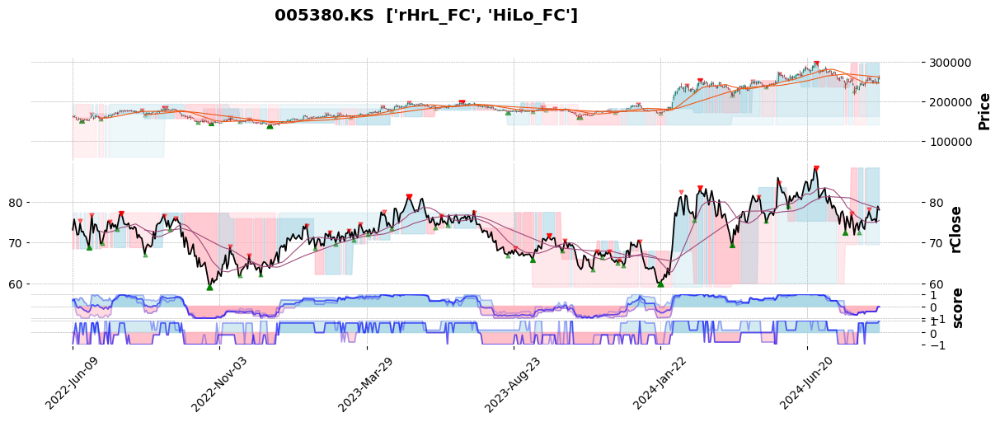

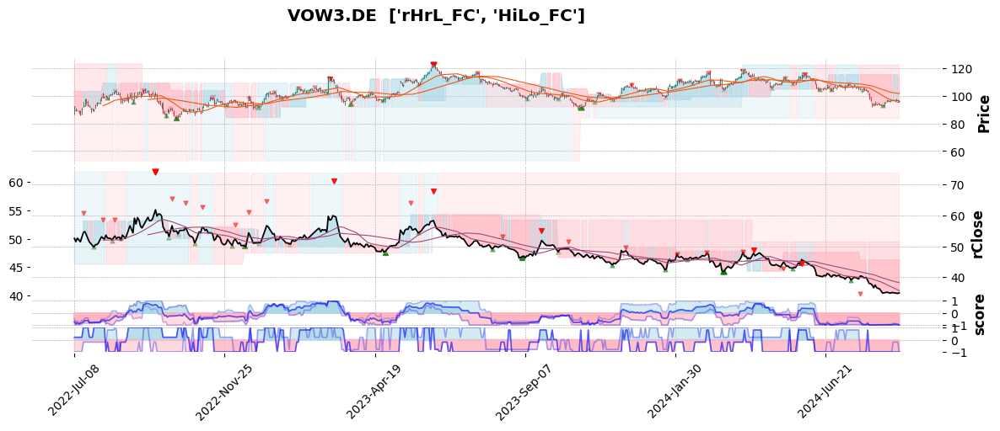

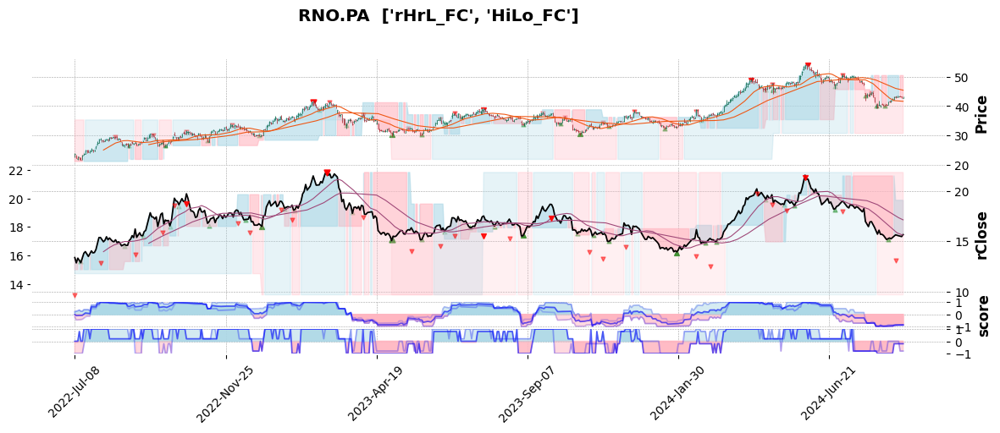

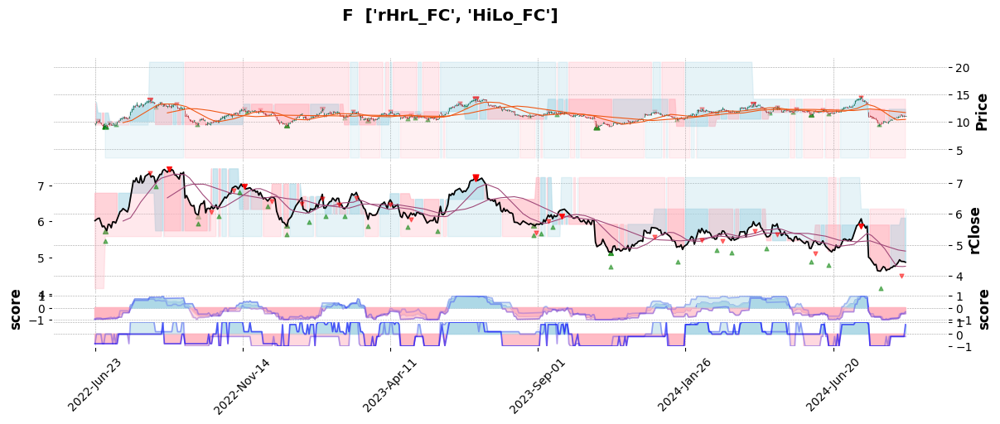

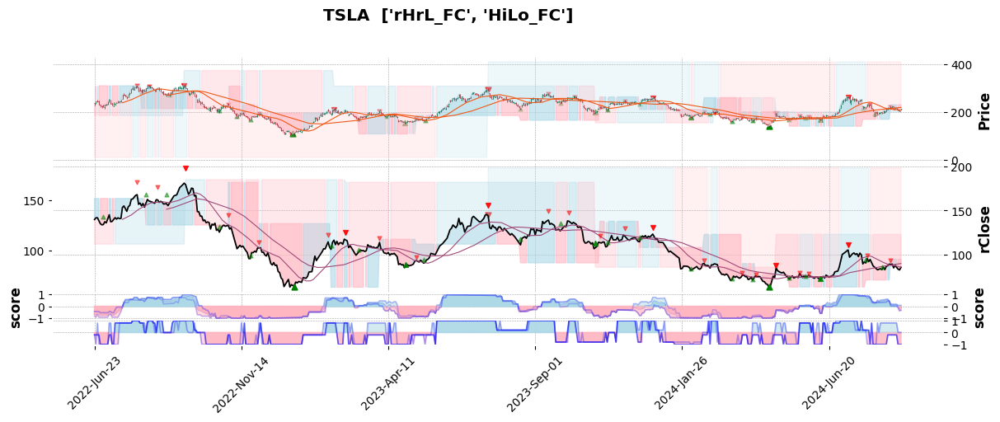

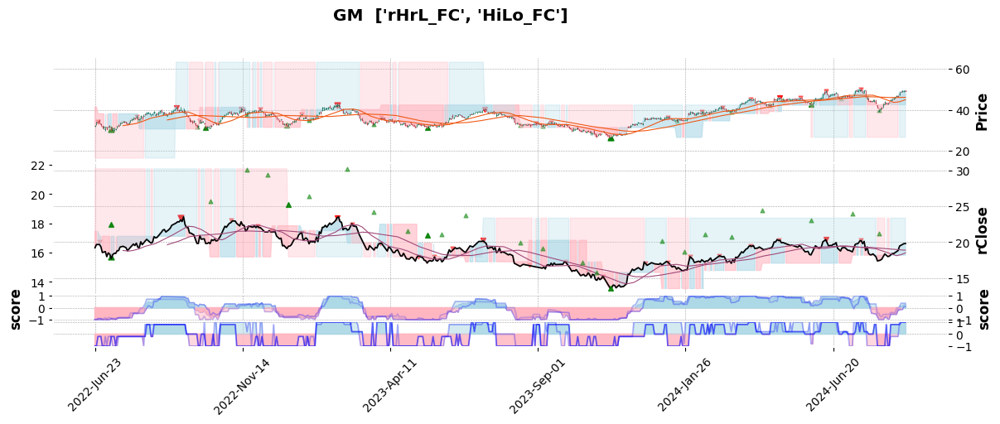

,Close,score,score_abs,score_rel,HiLo_FC,HiLo_HH,boHL100,boHL20,boHL50,borr100,borr20,borr50,emaC20/50,emar20/50,rHrL_FC,rHrL_HH,smaC20/50,smar20/50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,,,,,,,,,
GM,49.26,0.24,0.38,0.10,1.0,1.00,1.0,1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,0.78,-1.0,-1.0,0,0
005380.KS,258500.00,-0.04,-0.04,-0.04,1.0,-0.33,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-0.33,-1.0,-1.0,0,0
TSLA,213.79,-0.12,0.08,-0.32,-0.0,-0.33,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-0.56,-1.0,-1.0,0,0
F,11.03,-0.44,-0.52,-0.34,-0.2,-1.00,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,0.8,-0.56,-1.0,-1.0,0,0
7203.T,2720.50,-0.86,-0.82,-0.90,-0.2,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.2,-1.00,-1.0,-1.0,-1,-1
RNO.PA,43.16,-0.87,-0.89,-0.84,-0.8,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.2,-0.56,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.00,-1.0,-1.0,-1,-1


In [19]:
last_row_list= [] ; last_row_df = pd.DataFrame() ; fractals_list= [2, 3, 4]

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
        price_dict[ticker][f'sma{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_sma(price_dict[ticker], _c, st, lt)
        price_dict[ticker][f'ema{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_ema(price_dict[ticker], _c, st, lt)
        fractal_df(price_dict[ticker],_h,_l,_c)
        fractals_HH(price_dict[ticker], rel, rg_dict= {1:0.2, 2:0.6, 3:0.1, 4:0}, suffix= '_HH')        
        fractals_FC(price_dict[ticker], rel, rg_ch_dt = True,rg_dict= {1:0, 2:0.4, 3:0.5, 4:0.1}, suffix = '_FC')  
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',
                   f'sma{str(_c)[:1]}{str(st)}/{str(lt)}',f'ema{str(_c)[:1]}{str(st)}/{str(lt)}',
                   f'{str(_h)[:2]}{str(_l)[:2]}_HH',
                   f'{str(_h)[:2]}{str(_l)[:2]}_FC',]              
        regime_cols += rg_cols     
        
        mpf_fractals(price_dict[ticker][start_mpf:], fractals_list, color_up, color_down, size, pane)
        mpf_fractals_fill(price_dict[ticker][start_mpf:], fractals_list, alfa, color_bull, color_bear, pane,y_suffix= '_hl', rg_suffix=  '_FC')
        fields_list.append(f'{str(_h)[:2]}{str(_l)[:2]}_FC')
        pane = 0
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')  
    mpf_score(price_dict[ticker][start_mpf:], score_list = fields_list, vlabel = '', alfa =alfa, color_bull=color_bull, color_bear=color_bear, pane= 3)
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
             addplot= subplots,  panel_ratios = (2,2.5,0.5,0.5),)
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 11. A little more pleasant working format

We will revisit this visual rendition in subsequent chapters. This is a more compact easier on the eye working format

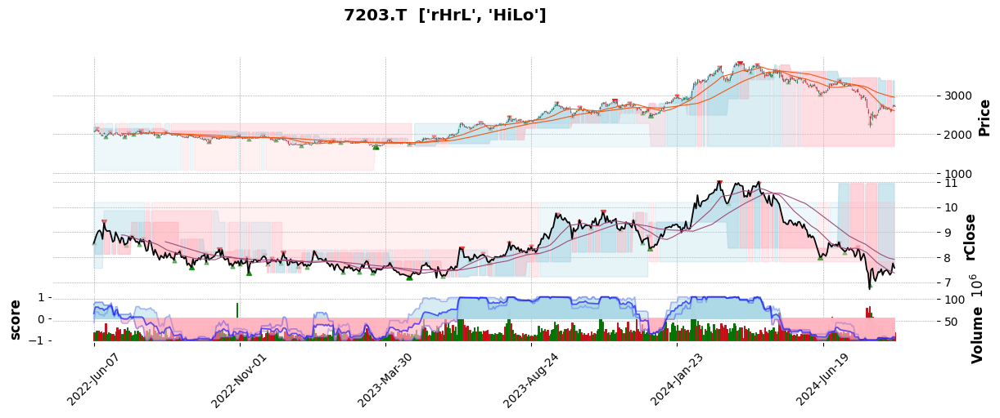

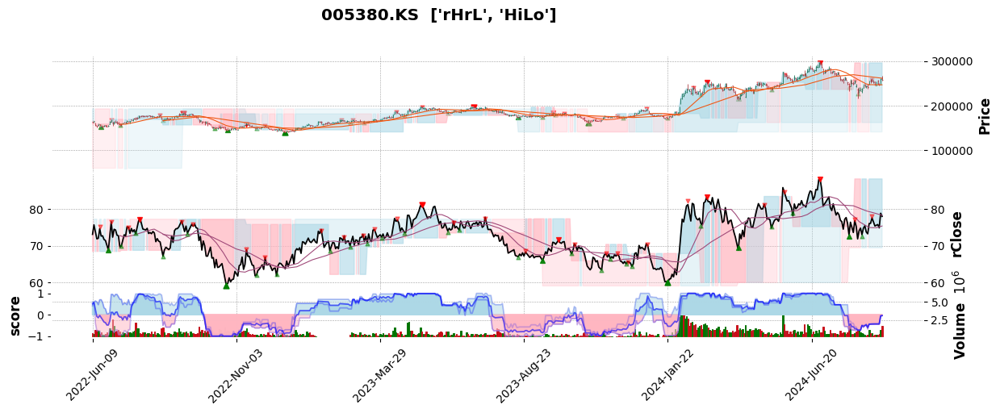

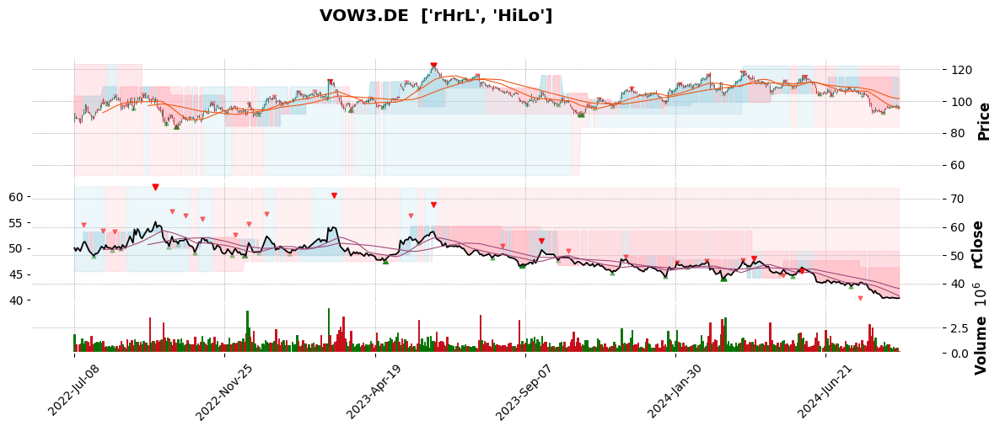

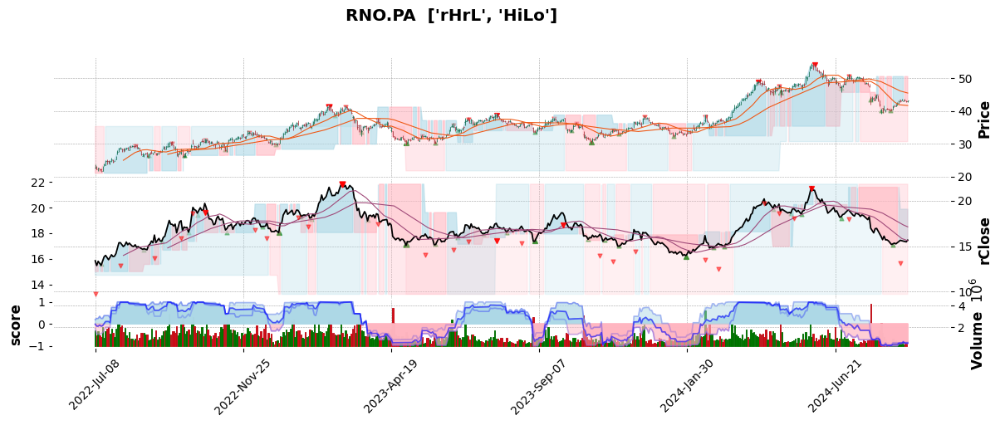

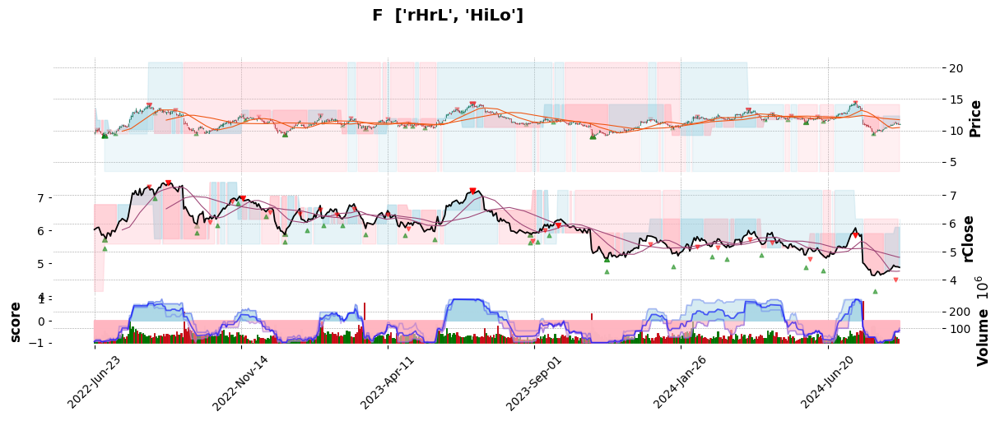

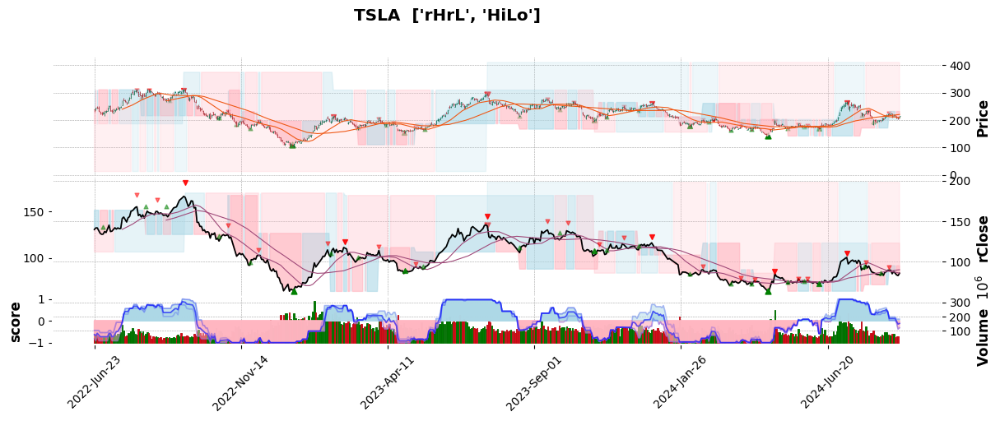

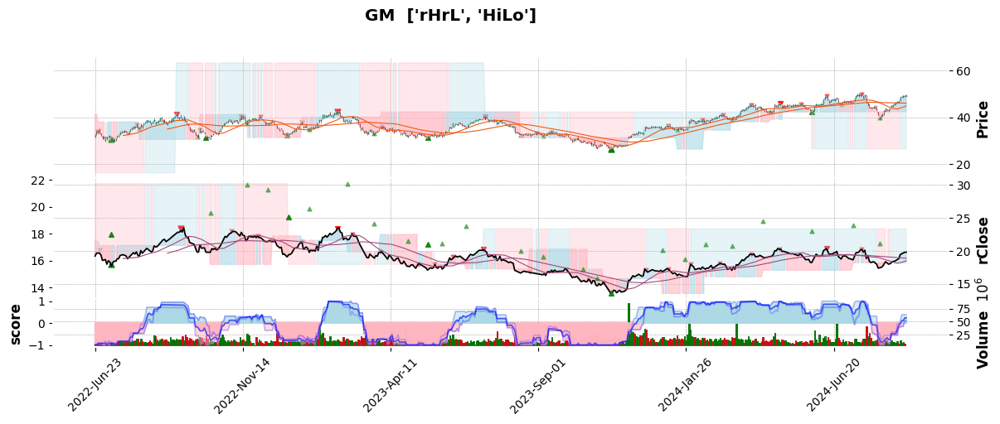

,Close,score,score_abs,score_rel,HiLo_FC,HiLo_HH,boHL100,boHL20,boHL50,borr100,borr20,borr50,emaC20/50,emar20/50,rHrL_FC,rHrL_HH,smaC20/50,smar20/50,ttHi20Lo50,ttrH20rL50
ticker,,,,,,,,,,,,,,,,,,,,
GM,49.26,0.24,0.38,0.10,1.0,1.00,1.0,1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,0.78,-1.0,-1.0,0,0
005380.KS,258500.00,-0.04,-0.04,-0.04,1.0,-0.33,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-0.33,-1.0,-1.0,0,0
TSLA,213.79,-0.12,0.08,-0.32,-0.0,-0.33,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,-0.56,-1.0,-1.0,0,0
F,11.03,-0.44,-0.52,-0.34,-0.2,-1.00,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,0.8,-0.56,-1.0,-1.0,0,0
7203.T,2720.50,-0.86,-0.82,-0.90,-0.2,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.2,-1.00,-1.0,-1.0,-1,-1
RNO.PA,43.16,-0.87,-0.89,-0.84,-0.8,-0.33,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.2,-0.56,-1.0,-1.0,-1,-1
VOW3.DE,96.30,-1.00,-1.00,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.00,-1.0,-1.0,-1,-1


In [21]:
last_row_list= [] ; last_row_df = pd.DataFrame() ; fractals_list= [2, 3, 4]

for ticker in tickers_fx_dict:    
    subplots = [] ; rg_cols = [] ; regime_cols = [] ; fields_list = [] ;  pane = 1
    mpf_relative(price_dict[ticker][start_mpf:], rel=True, sma_list= sma_list, pane=1, color= 'k')
    
    for rel in rel_list:
        price_dict[ticker]['score_rel'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)        
        _o,_h,_l,_c = rohlc(price_dict[ticker],relative = rel)  
            
        for slt in sorted(bo_list): 
            price_dict[ticker][f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}'] = regime_breakout(price_dict[ticker],_h,_l,slt)          
        price_dict[ticker][f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}'] = turtle_trader(price_dict[ticker], _h, _l, st, lt)
        price_dict[ticker][f'sma{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_sma(price_dict[ticker], _c, st, lt)
        price_dict[ticker][f'ema{str(_c)[:1]}{str(st)}/{str(lt)}'] = regime_ema(price_dict[ticker], _c, st, lt)
        fractal_df(price_dict[ticker],_h,_l,_c)
        fractals_HH(price_dict[ticker], rel, rg_dict= {1:0.2, 2:0.6, 3:0.1, 4:0}, suffix= '_HH')        
        fractals_FC(price_dict[ticker], rel, rg_ch_dt = True,rg_dict= {1:0, 2:0.4, 3:0.5, 4:0.1}, suffix = '_FC')  
              
        rg_cols = [f'bo{str(_h)[:1]}{str(_l)[:1]}{str(st)}', f'bo{str(_h)[:1]}{str(_l)[:1]}{str(lt)}',f'bo{str(_h)[:1]}{str(_l)[:1]}{str(xlt)}',
                   f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}',
                   f'sma{str(_c)[:1]}{str(st)}/{str(lt)}',f'ema{str(_c)[:1]}{str(st)}/{str(lt)}',
                   f'{str(_h)[:2]}{str(_l)[:2]}_HH',
                   f'{str(_h)[:2]}{str(_l)[:2]}_FC',]              
        regime_cols += rg_cols        
            
        # for t, slt in enumerate(sorted(bo_list)):
        #     mpf_breakout(price_dict[ticker][start_mpf:], color_bull, color_bear, alfa/(t+1), pane, slt, field=f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}')
        #     fields_list.append(f'bo{str(_h)[:1]}{str(_l)[:1]}{str(slt)}')        
        # pane = 0  
        
        # mpf_turtle(price_dict[ticker][start_mpf:], st, lt, color_bull, color_bear, alfa, pane, field= f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}')
        # fields_list.append(f'tt{str(_h)[:2]}{str(st)}{str(_l)[:2]}{str(lt)}')
        # pane = 0   
        
        # mpf_sma(price_dict[ticker][start_mpf:], st, lt, color_bull, color_bear, alfa, pane, field= f'sma{str(_c)[:1]}{str(st)}/{str(lt)}')
        # fields_list.append(f'sma{str(_c)[:1]}{str(st)}/{str(lt)}')
        # pane = 0
        
        mpf_fractals(price_dict[ticker][start_mpf:], fractals_list, color_up, color_down, size, pane)
        mpf_fractals_fill(price_dict[ticker][start_mpf:], fractals_list, alfa, color_bull, color_bear, pane,y_suffix= '_hl', rg_suffix=  '_FC')
        fields_list.append(f'{str(_h)[:2]}{str(_l)[:2]}')
        pane = 0
            
    price_dict[ticker]['score_abs'] = price_dict[ticker][rg_cols].mean(axis=1).round(2)   
    price_dict[ticker]['score'] = price_dict[ticker][regime_cols].mean(axis=1).round(2)
    mpf_score(price_dict[ticker][start_mpf:], score_list, alfa, color_bull, color_bear, pane= 2, vlabel = 'score')        
    mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
             addplot= subplots, 
    volume= True, volume_panel = 2, panel_ratios = (2,2,0.8),)    
    
    # mpf.plot(price_dict[ticker][start_mpf:], type= 'ohlc', style= 'charles', figsize= (15,5), title =  f'{ticker}  {fields_list}', mav = tuple(sorted(sma_list)),
    #          addplot= subplots,  panel_ratios = (2,2.5,0.5,0.5),)
    last_row_list.append(last_row_cols_dict(price_dict[ticker],ticker,df_cols=list(price_dict[ticker].columns)))    
        
last_row_df = pd.DataFrame.from_dict(last_row_list).set_index('ticker')
last_row_df[['Close','score','score_abs','score_rel']+ sorted(regime_cols)].sort_values(by ='score', ascending = False)

### 12. Plotly library 

 Plotly makes interactive charts. It is particularly useful to visualise swing highs and lows. 
 The following block of code plots fractals and moving averages for both relative and absolute series. Whilst it is possibel to plot concurrently two series, it is best to separe them. The window at the bottom allows dynamic reframing  

In [23]:
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plotly_ohlc(df, ticker, rel_list, fractals_list, sma_list, _v= "Volume"):
    data = df.copy()
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    # Colour palette:  https://matplotlib.org/stable/gallery/color/named_colors.html
    # Marker style: https://plotly.com/python/marker-style/
    secondary = False ; up_color = 'green' ; down_color = 'red' ; sma_color = 'blue'
    for r,rel in enumerate(rel_list):
        _o,_h,_l,_c = rohlc(data,relative = rel)
        fig.add_trace(go.Ohlc(x=data.index, open=data[_o], high=data[_h], low=data[_l], close = data[_c] , 
                                increasing=dict(line=dict(color= up_color)), decreasing=dict(line=dict(color= down_color)),
                        name = f'{str.upper(ticker)} rel:{rel}',opacity = (len(rel_list)-r)/len(rel_list)),secondary_y = secondary)

        hl_dict = {_h :'black',_l: 'black'}
        positiontext = 'top center' ; m_sym = 'triangle-down'
        for t, hl in enumerate(hl_dict):        
            for s,f in enumerate(sorted(fractals_list)):
                if f'{str(hl)[:2]}{str(f)}' in data.columns:
                    if f == min(fractals_list):
                        txt = data[f'{str(hl)[:2]}{str(f)}'].round(2)
                    elif f > min(fractals_list):
                        txt = None
                    fractal = go.Scatter(x = data.index, y = data[f'{str(hl)[:2]}{str(f)}'] ,
                                         text = txt, name = f'{str(hl)[:2]}{str(f)}',
                            mode = 'markers + text', textposition = positiontext, marker_symbol= m_sym,                    
                            line = dict(color =hl_dict[hl]), 
                            opacity = min((s+2)/(len(fractals_list)),1),
                            marker_size= 15 * min((s+2)/len(fractals_list),1))
                    fig.add_trace(fractal,secondary_y = secondary)
            positiontext = 'bottom center' ; m_sym = 'triangle-up'

        for m, sma  in enumerate(sorted(sma_list)):
            sma = go.Scatter(x = data.index, y = data[_c].rolling(sma).mean(), 
                            mode = 'lines', name = f'sma{str(_c)[:2]} {sma}', 
                            line = dict(color = sma_color), opacity = (m+1)/len(sma_list))
            fig.add_trace(sma,secondary_y = secondary)
        secondary = True ; up_color = 'cyan' ; down_color = 'grey' ; sma_color = 'olivedrab' ;

    # include a go.Bar trace for volumes if rel_list has one value
    if len(rel_list) <2: 
        fig.add_trace(go.Bar(x=data.index, y=data[_v],name = _v, opacity= 0.5 ),secondary_y= True)
        fig.layout.yaxis2.title= str(_v)
    elif len(rel_list) == 2:
        fig.layout.yaxis2.title= f'{str.upper(ticker)} rel: {rel}'
    fig.layout.yaxis1.title= f'{str.upper(ticker)} rel: {rel_list[0]}'
    fig.layout.xaxis.title = f'{str.upper(ticker)} relative: {rel_list}'
    fig.layout.xaxis.showgrid= True
    fig.layout.yaxis1.showgrid= False
    fig.layout.yaxis2.showgrid= True
    fig.show() 
    


In [24]:
plotly_ohlc(price_dict[ticker][start_mpf:], ticker, rel_list= [True, False], fractals_list= [2,3,4], sma_list= sma_list[:2], _v= "Volume")
plotly_ohlc(price_dict[ticker][start_mpf:], ticker, rel_list= [True], fractals_list= [2,3,4], sma_list= sma_list[:2], _v= "Volume")
plotly_ohlc(price_dict[ticker][start_mpf:], ticker, rel_list= [False], fractals_list= [2,3,4], sma_list= sma_list[:2], _v= "Volume")

### 13. Comparison between higher highs, higher lows and Floor & Ceiling

Let's compare the higher highws with the floor & ceiling methodology. They both use swings and the former inspired the latter. The floor & ceiling is conceptually like the right side of the head & shoulder pattern. A fractal is a lower low surrounded by 2 higher lows for a bottom or a higher high surrounded by 2 lower highs for a top. For example, a floor at level 3 happens when 2 higher lows surround a lower low at level 2. 
1. This higher low at level 2 is the last part of the hihilolo pattern
2. For the pattern to be complete, it needs to be preceded by a higher high. This is where the Floor & Ceiling and hihilolo pattern can sometimes diverge. The market does not always follow a neat succession of higher highs and higher lows. The market may continue to print lower highs before bottoming out and eventually turning bullish.  Worst case scenario, the hihilolo methodology lags the floor & ceiling methodology by one swing.
3. Fortunately, the regime function has a failsafe. When the price rises above the highest low, regime will turn bullish

In conclusion,  both regime methodologies are similar. hihilolo one level lower is roughly the equivalent of the floor  & ceiling one level higher.

<AxesSubplot: title={'center': 'GM relative'}, xlabel='Date'>

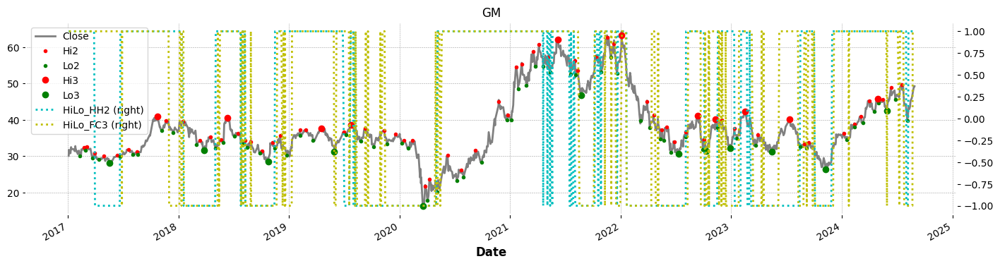

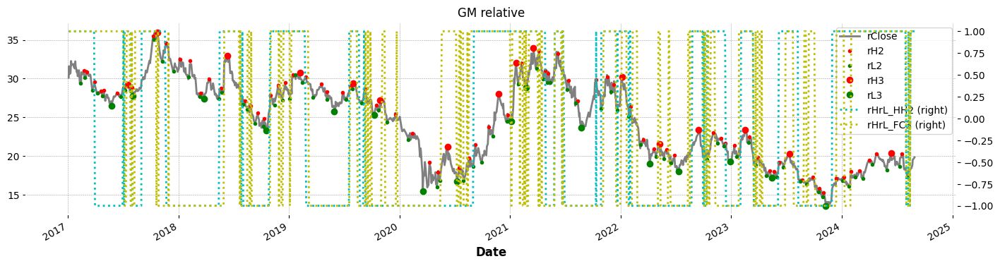

In [25]:
price_dict[ticker][[
    'Close',
    'Hi2','Lo2',
    'Hi3', 'Lo3',
    'HiLo_HH2', 'HiLo_FC3',
    ]].plot(title =ticker,figsize =(17,4), 
            secondary_y = ['HiLo_HH2', 'HiLo_FC3'],style = ['grey','r.', 'g.', 'ro', 'go','c:','y:' ])
    
price_dict[ticker][[
    'rClose',
    'rH2','rL2',
    'rH3', 'rL3',
    'rHrL_HH2', 'rHrL_FC3',
    ]].plot(title =f'{ticker} relative',figsize =(17,4), 
            secondary_y = ['rHrL_HH2', 'rHrL_FC3'],style = ['grey','r.', 'g.', 'ro', 'go','c:','y:' ])  

### 14. Looking for the bar that triggered the bear market

An avalanche starts with a little snow ball... Would you like to find the bar that triggered the bear market?

Indicators generally require default parameters. For example, the RSI default is 14 periods, MACD is (12,26) etc. They generally do not translate well from one timeframe to the next. 
My dream has always been to develop a methodology that would be congruent across asset classes, timeframes without having to adjust parameters. 
The Floor and ceiling methodology using fractals does not require default value. It preserves integrity across timeframes. It can be universally applied across timeframes, asset classes. 
A bear market at a daily level can be traced back to the precise minute that started the avalanche.

Let's see if the fractals methodology to calculate Floor & Ceiling as well as Higher High Higher Low would fit the bill.





1. We will download long-term historical one minute OHLCV data 
2. We will concatenate this data into a gigantic dataframe
3. We will define a resample ohlcv function
2. Define dictionaries for download intervals & periods/duration and resampling period
2. Loop trhough intervals calculate fractals, higher higher low and  Floor & Ceiling regimes
3. Resample 
4. Create dataframes for each time interval
5. Plot prices, fractals and regimes for df and resampled dfs



### One Minute Data for SPY ETF




1. One Minute OHLCV data
Shout out to this wonderful resources: 'https://oneminutedata.com'. In the next section, we want to calculate fractals and regime at various time intervals. 

We have copied the link from the website and built a list. The address may periodicially change. SO, let's spend a few minutes building the dataframe

1. go to 'https://oneminutedata.com/spy-intraday-data'  
2. right click on Download Link, 'Copy Link Address'
3. Paste link in list
4. Loop through list using read_csv(index_col=0, parse_dates= True,compression = 'gzip'). Data is compressed using gzip, parse dates
5. Concatenate along the vertical axis= 0


In [26]:

one_minute_weblinks = [ # Website source data: 'https://oneminutedata.com/spy-intraday-data' 
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2024_6e0851922b721890a49c6a240c230ba39670d1a7.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2023_703d78ef9b61798e6de7dd6bf8d8a668d51e5aaa.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2022_b0cb458763c66c311a46aa1f8b8549ded4e9da6f.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2021_b65d518b0047dd8eaa2c2c3a98c6f61ea8637569.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2020_cdb851e720986036f80db3aeeb5943e11490f10f.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2019_82b12186b367ab8006e0bf6c51c61f61a471e7ff.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2018_8347579bc522cc3617ace45ff3f81dc0df5a04d7.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2017_28c365f5e53b09b163ca8f36d62d82ae434ca538.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2016_c39e8ddcd9bced3a283b987d1ef91048ccfbe6bd.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2015_736c7bd2f88a7bdcd476fbdf0dedfd66b8c217a2.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2014_a8e5ee2292b7ebd074baf6720412476ecc19c441.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2013_e8bb4ae219ec14fcbe73ff011b6c537ba0b25fd7.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2012_a89a832898914f255e370b16908f536ff851538f.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2011_e63fe48d566afde3820631656e6cf2b313a71e00.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2010_16cd469f7011689f465dc50e13a6076853745de6.csv.gz',
                       'https://indigo-gazelle-447398.hostingersite.com/data/spy/spy_2009_3aa7d5c5434c69cb4ad89073c9cfe5a22db2713f.csv.gz',]
                       
historical_df_1min = pd.DataFrame()

for weblink in one_minute_weblinks:
    df = pd.read_csv(weblink, index_col=0, parse_dates= True,compression = 'gzip')
    historical_df_1min = pd.concat([historical_df_1min, df], axis =0)
    print(df.tail(1))

historical_df_1min.shape

                       open    high     low   close   volume
date                                                        
2024-03-28 15:59:00  523.93  524.11  522.93  523.21  6366344
                       open    high     low  close   volume
date                                                       
2023-12-29 15:59:00  475.09  475.78  475.08  475.4  7370283
                       open    high     low   close   volume
date                                                        
2022-12-30 15:59:00  382.26  382.58  382.06  382.38  5925290
                      open    high     low   close   volume
date                                                       
2021-12-31 15:59:00  474.9  475.12  474.67  475.12  4619736
                      open    high     low   close   volume
date                                                       
2020-12-31 15:59:00  374.3  374.66  373.83  374.25  6074440
                        open    high      low   close   volume
date                           

(1487346, 5)

### Resample data

we now have data down to the one minute bar level. Let's resample all the way up to weekly and process each level

1. We create a dictionary to index dataframes
2. We create a list of periods from '1min' to '1w'
3. We loop through the interval_list to populate the dictionary of resampled dataframes
4. We calculate regimes for each period
5. If you feel like saving data flag True 
6. Print shape of each dataframe


In [27]:
def resample_ohlcv(df, rel, period ):
    _o,_h,_l,_c = rohlc(df,relative = rel) 
    ohlcv_dict = {_o: 'first',_h: 'max',_l:'min',_c: 'last','volume': 'sum'}
    intraday_dict = {dct : 'mean' for dct in df.columns[5:]}
    ohlcv_dict.update(intraday_dict)
    df_resampled = df.resample(period, closed='left', label='right').apply(ohlcv_dict)
    df_resampled = df_resampled.dropna(subset = [_o,_h,_l,_c])
    return df_resampled


In [28]:
_o,_h,_l,_c = rohlc(df,relative = False)
rg_dict = {t : round(t*0.1,1) for t  in range(1,16)}
rel= False ;  rg_ch_dt = True

df_dict = {}
interval_list= ['1min','2min','3min','4min','5min','10min','15min','20min','30min','1h','4h','1d','1W']

df_1min = historical_df_1min.copy()

for interval in interval_list:
    if interval != '1min':        
        df_dict[interval]= resample_ohlcv(df_1min, rel= False, period = interval)
    else :
        df_dict[interval]= df_1min.copy()
    print(interval, df_dict[interval].shape, end = " ")
    df_dict[interval] = fractal_df(df_dict[interval],_h,_l,_c)
    df_dict[interval] = fractals_HH(df_dict[interval], rel, rg_dict, suffix= '_HH')
    df_dict[interval] = fractals_FC(df_dict[interval], rel, rg_ch_dt, rg_dict, suffix = '_FC') 
    # if save_data_boolean:
    #     df_dict[interval].to_csv(directory /f'SPY_{interval}.csv')
    print(df_dict[interval].shape)

1min (1487346, 5) (1487346, 98)
2min (743732, 5) (743732, 86)
3min (495861, 5) (495861, 86)
4min (373823, 5) (373823, 86)
5min (297559, 5) (297559, 86)
10min (148818, 5) (148818, 74)
15min (99228, 5) (99228, 74)
20min (76342, 5) (76342, 74)
30min (49641, 5) (49641, 67)
1h (26757, 5) (26757, 69)
4h (7661, 5) (7661, 55)
1d (3834, 5) (3834, 50)
1W (796, 5) (796, 38)


Let's plot Highs and lows at different fractal levels on the 2 minute bar.

<AxesSubplot: title={'center': '2min'}, xlabel='date'>

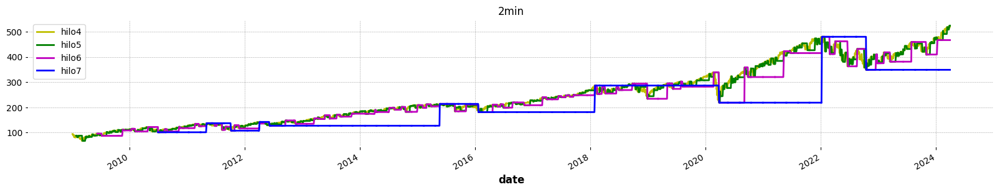

In [29]:
interval = '2min'
df_dict[interval][[
    # 'close',
    'hilo4','hilo5','hilo6', 'hilo7',
    ]].plot(figsize=(20,3), secondary_y = ['close'], grid=True,style = ['y','g','m','b'], title = interval)

### Join different intervals into one resampled dataframe

Step 1: Create a dictionary comprehension of the specific fields we want join across all time intervals

Let's build a dataframe of data resmapled at various time intervals. 

1. We create a customised list of intervals from interval_list. Make sure the shortest interval is the first item in the list
2. We build a dictionary comprehension of the column names we want to join:

    1. we loop through a range from fractals level 2 to 10 
    2. We create a list of fields
    3. We pass a boolean test: if the field is present in the columns, update the field_list_dict

    

In [30]:
interval_list_join = ['5min', '15min','30min', '1h', '4h','1d', '1W']
print(interval_list_join)

field_list_dict = {interval:[field for i in range(2,10) 
                               for field in [f'hilo{i}',f'hilo{i}_ch',f'hilo{i}_fc',f'hilo{i}_hl', f'hilo_HH{i}',f'hilo_FC{i}'] 
                               if field in df_dict[interval].columns] 
               for interval in interval_list_join }

['5min', '15min', '30min', '1h', '4h', '1d', '1W']


### Join different intervals into one resampled dataframe

Step 2: Join df of various time intervals from the shortest one

1. Create resampled_df by copying the first element in the interval_list_join
2. Before processing data, we count the number of columns in the resampled_df. We will use this number fill na
3. We loop through the interval_list_join:
    1. We join df from each interval in the list and add the suffix of the time interval. 
    2. We use the "outer" method to add add missing time series
4. We fill forward missing values for the first columns and all columns joined

In [31]:
resampled_df =  df_dict[interval_list_join[0]].copy()
resampled_df_length = len(resampled_df.columns)

for interval in interval_list_join:
    print(interval, len(resampled_df.columns), len(df_dict[interval][field_list_dict[interval]].columns), end=', ')
    resampled_df = resampled_df.join(df_dict[interval][field_list_dict[interval]],rsuffix=f'_{interval}', how= 'outer')
resampled_df.iloc[:,:5] = resampled_df.iloc[:,:5].ffill()
resampled_df.iloc[:,86:] = resampled_df.iloc[:,resampled_df_length:].ffill().round(2)

resampled_df.tail()

5min 86 36, 15min 122 30, 30min 152 26, 1h 178 28, 4h 206 20, 1d 226 18, 1W 244 12, 

,open,high,low,close,volume,lo1,hi1,hilo1,lo2,hi2,...,hilo2_fc_1W,hilo2_hl_1W,hilo_HH2_1W,hilo_FC2_1W,hilo3_1W,hilo3_ch_1W,hilo3_fc_1W,hilo3_hl_1W,hilo_HH3_1W,hilo_FC3_1W
date,,,,,,,,,,,,,,,,,,,,,
2024-03-28 15:50:00,524.08,524.14,523.75,523.8800,1109885.0,NaN,NaN,524.409,NaN,NaN,...,414.9,389.1,1.0,1.0,358.71,411.66,358.71,237.95,1.0,1.0
2024-03-28 15:55:00,523.87,524.10,523.58,523.9099,2788721.0,NaN,NaN,524.409,NaN,NaN,...,414.9,389.1,1.0,1.0,358.71,411.66,358.71,237.95,1.0,1.0
2024-03-28 16:00:00,523.91,524.20,522.93,523.2100,8979498.0,NaN,NaN,524.409,NaN,NaN,...,414.9,389.1,1.0,1.0,358.71,411.66,358.71,237.95,1.0,1.0
2024-03-29 00:00:00,523.91,524.20,522.93,523.2100,8979498.0,NaN,NaN,NaN,NaN,NaN,...,414.9,389.1,1.0,1.0,358.71,411.66,358.71,237.95,1.0,1.0
2024-03-31 00:00:00,523.91,524.20,522.93,523.2100,8979498.0,NaN,NaN,NaN,NaN,NaN,...,414.9,389.1,1.0,1.0,358.71,411.66,358.71,237.95,1.0,1.0


### Plot fractals at various levels across time intervals

We can now visualise regime across time intervals and fractal levels. We will plot the following:
1. Higher Higher Higher Low on a daily bar at level 2 versus level 4 on 5 minute bar
2. Higher Higher Higher Low on a daily bar at level 3 versus level 5 on 5 minute bar

It seems the hypothesis has been validated. We can identify the 5 minute bar that leads to a bear/bull market on daily bars


<AxesSubplot: title={'center': 'hilo_HH3_1d, hilo_HH5_5min, hilo_HH3_1d_HH5_5min'}, xlabel='date'>

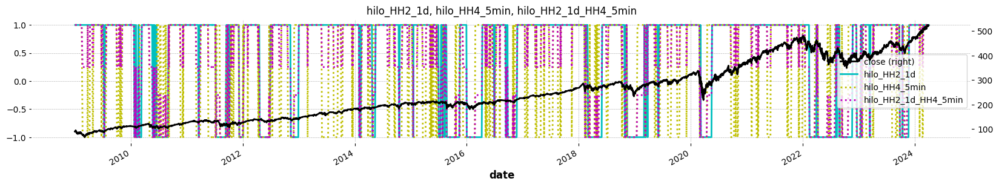

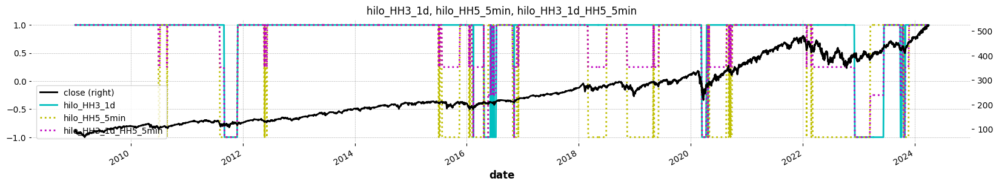

In [32]:
resampled_df['hilo_HH2_1d_HH4_5min'] = (0.5 * resampled_df['hilo_HH2_1d'] + 0.3 * resampled_df['hilo_HH4_5min']) /0.8
resampled_df[['close',
              'hilo_HH2_1d','hilo_HH4_5min','hilo_HH2_1d_HH4_5min',
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style =  ['k','c','y:','m:'],
                              title=f'hilo_HH2_1d, hilo_HH4_5min, hilo_HH2_1d_HH4_5min' )

resampled_df['hilo_HH3_1d_HH5_5min'] = (0.5 * resampled_df['hilo_HH3_1d'] + 0.3 * resampled_df['hilo_HH5_5min']) /0.8
resampled_df[['close',
              'hilo_HH3_1d','hilo_HH5_5min','hilo_HH3_1d_HH5_5min' ,
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style = ['k','c','y:','m:'], 
                              title= f'hilo_HH3_1d, hilo_HH5_5min, hilo_HH3_1d_HH5_5min' )

Next, we repeat the exercise using the Floor & Ceiling methodology.

This method is noisier as it requires fewer conditions and it is based of the latest swing, not the extreme point.

We will plot the following:
1. Level 3 daily and level 5 5 minutes, weighted combination of both
2. Level 4 daily and level 6 5 minutes, weighted combination of both

<AxesSubplot: title={'center': 'hilo_FC4_1d, hilo_FC6_5min, hilo_FC4_1d_FC6_5min'}, xlabel='date'>

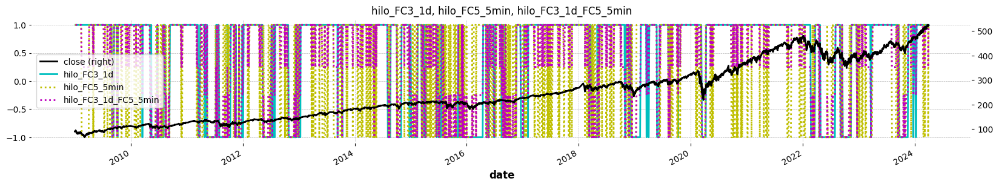

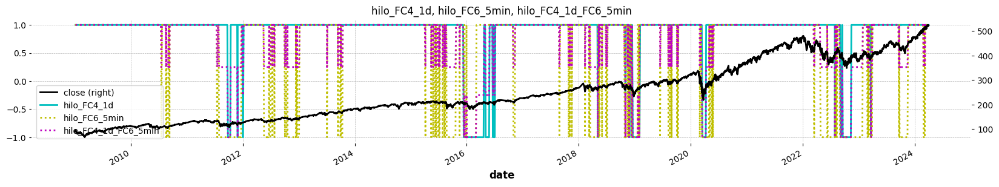

In [33]:
resampled_df['hilo_FC3_1d_FC5_5min'] = (0.5 * resampled_df['hilo_FC3_1d'] + 0.3 * resampled_df['hilo_FC5_5min']) /0.8
resampled_df[['close',
              'hilo_FC3_1d','hilo_FC5_5min', 'hilo_FC3_1d_FC5_5min',
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style = ['k','c','y:','m:'], 
                              title=f'hilo_FC3_1d, hilo_FC5_5min, hilo_FC3_1d_FC5_5min'  )

resampled_df['hilo_FC4_1d_FC6_5min'] = (0.5 * resampled_df['hilo_FC4_1d'] + 0.3 * resampled_df['hilo_FC6_5min']) /0.8
resampled_df[['close',
              'hilo_FC4_1d','hilo_FC6_5min','hilo_FC4_1d_FC6_5min',
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style = ['k','c','y:','m:'], 
                              title= f'hilo_FC4_1d, hilo_FC6_5min, hilo_FC4_1d_FC6_5min' )

In this example, we use two different fractal methods.

We plot the shorter timeframe with the higher high, higher low method and the longer timeframe using the floor & ceiling method.
    1. Floor & Ceiling level 3 daily bar, Higher High Higher Low level 4 on 5 minute bar, and weighted combination of both
    2. Floor & Ceiling level 4 daily bar, Higher High Higher Low level 5 on 5 minute bar, and weighted combination of both

<AxesSubplot: title={'center': 'hilo_FC4_1d, hilo_FC6_5min, hilo_FC4_1d_HH5_5min'}, xlabel='date'>

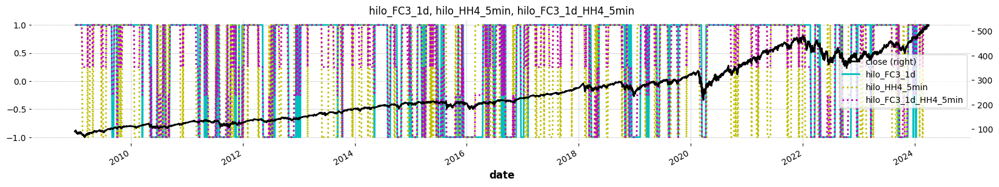

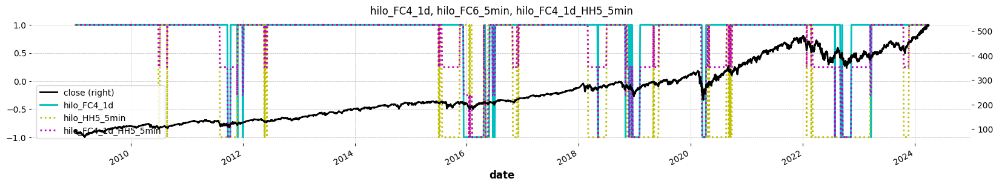

In [34]:
resampled_df['hilo_FC3_1d_HH4_5min'] = (0.5 * resampled_df['hilo_FC3_1d'] + 0.3 * resampled_df['hilo_HH4_5min']) /0.8
resampled_df[['close',
              'hilo_FC3_1d','hilo_HH4_5min', 'hilo_FC3_1d_HH4_5min',
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style = ['k','c','y:','m:'],
                              title=f'hilo_FC3_1d, hilo_HH4_5min, hilo_FC3_1d_HH4_5min', )
              
resampled_df['hilo_FC4_1d_HH5_5min'] = (0.5 * resampled_df['hilo_FC4_1d'] + 0.3 * resampled_df['hilo_HH5_5min']) /0.8
resampled_df[['close',
              'hilo_FC4_1d','hilo_HH5_5min','hilo_FC4_1d_HH5_5min',
              ]].ffill().plot(figsize=(20,3), secondary_y = ['close'], style = ['k','c','y:','m:'], 
                              title= f'hilo_FC4_1d, hilo_FC6_5min, hilo_FC4_1d_HH5_5min' )